In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np
import os
import torch.nn.functional as F
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import seaborn as sns
import torch.utils.checkpoint as checkpoint
from tqdm import tqdm
from torch.amp import GradScaler,autocast

In [2]:
# Constants for MNIST
MNIST_IMG_SIZE = 128
MNIST_BATCH_SIZE = 32
MNIST_EPOCHS = 10
MNIST_LEARNING_RATE = 0.001
MNIST_CHANNEL = 1

In [3]:
# Constants for Caltech-101
CALTECH_IMG_SIZE = 224  # Increased image size for Caltech-101
CALTECH_BATCH_SIZE = 64
CALTECH_EPOCHS = 30
# Learning rate adjustment for both optimizers
CALTECH_LEARNING_RATE_ADAM = 0.003
CALTECH_LEARNING_RATE_SGD = 0.01
CALTECH_CHANNEL = 3

In [4]:
print(f"CUDA Available: {torch.cuda.is_available()}")
print(f"Current Device: {torch.cuda.current_device()}")
print(f"Device Name: {torch.cuda.get_device_name(torch.cuda.current_device())}")

CUDA Available: True
Current Device: 0
Device Name: NVIDIA GeForce RTX 4060 Laptop GPU


In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [6]:
results_file_path = 'training_results.parquet'
model_save_path = 'model_checkpoints/'

# Ensure directory for model checkpoints exists
if not os.path.exists(model_save_path):
    os.makedirs(model_save_path)

In [7]:
class DatasetHandler:
    def __init__(self, dataset_name, img_size, data_dir='./data'):
        self.dataset_name = dataset_name
        self.img_size = img_size
        self.data_dir = data_dir
        self.dataset = None

    def load_dataset(self):
        if self.dataset_name == 'mnist':
            dataset_class = datasets.MNIST
            transform = transforms.Compose([
                transforms.Resize((self.img_size, self.img_size)),
                transforms.ToTensor(),
                transforms.Normalize((0.1307,), (0.3081,))
            ])
        elif self.dataset_name == 'caltech101':
            dataset_class = datasets.Caltech101
            transform = transforms.Compose([
                transforms.Resize((CALTECH_IMG_SIZE, CALTECH_IMG_SIZE)),
                transforms.RandomHorizontalFlip(),
                transforms.RandomRotation(20),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
                transforms.ToTensor(),
                transforms.Lambda(lambda x: x.repeat(3, 1, 1) if x.shape[0] == 1 else x),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
            ])

        else:
            raise ValueError(f"Unsupported dataset: {self.dataset_name}")
        
        try:
            self.dataset = dataset_class(root=self.data_dir, download=False, transform=transform)
            print(f"Loaded {self.dataset_name} from local storage.")
        except:
            print(f"{self.dataset_name} not found locally, downloading...")
            self.dataset = dataset_class(root=self.data_dir, download=True, transform=transform)
            print(f"Downloaded and stored {self.dataset_name}.")

        return self.dataset

    def get_train_test(self, batch_size):
        if self.dataset is None:
            self.load_dataset()

        train_size = int(0.8 * len(self.dataset))
        test_size = len(self.dataset) - train_size
        train_dataset, test_dataset = torch.utils.data.random_split(self.dataset, [train_size, test_size])

        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

        return train_loader, test_loader


In [8]:
def checkpointed_conv(conv_layer, x):
        """Helper function to checkpoint convolutional layer"""
        return checkpoint.checkpoint(lambda input: conv_layer(input), x,use_reentrant=False)

In [9]:
class MNISTModel(nn.Module):
    def __init__(self, num_classes=10, pooling_type='max'):
        super(MNISTModel, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3,padding=1, padding_mode='reflect')
        self.pool = nn.MaxPool2d(2, 2) if pooling_type == 'max' else nn.AvgPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3,padding=1, padding_mode='reflect')
        self.fc1 = None  # Initialize fc1 later
        self.fc2 = nn.Linear(128, num_classes)

    def initialize_fc1(self, input_shape):
        self.feature_size = self._get_conv_output(input_shape)
        self.fc1 = nn.Linear(self.feature_size, 128).to(device)

    def _get_conv_output(self, shape):
        input = torch.rand(1, *shape).to(device)
        output = self.pool(F.relu(self.conv1(input)))
        output = self.pool(F.relu(self.conv2(output)))
        return int(np.prod(output.size()))

    def forward(self, x, return_feature_maps=False, apply_softmax=False):
        feature_maps = []
        
        # Apply checkpointing to save memory
        x = checkpointed_conv(self.conv1, x)
        x = self.pool(F.relu(x))
        if return_feature_maps:
            feature_maps.append(x)
        
        x = checkpointed_conv(self.conv2, x)
        x = self.pool(F.relu(x))
        if return_feature_maps:
            feature_maps.append(x)

        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        
        if apply_softmax:
            x = F.softmax(x, dim=1)

        if return_feature_maps:
            return x, feature_maps
        return x


In [10]:
class Caltech101Model(nn.Module):
    def __init__(self, num_classes=101, pooling_type='max'):
        super(Caltech101Model, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3,padding=1, padding_mode='reflect')  # 3 input channels for Caltech101
        self.pool = nn.MaxPool2d(2, 2) if pooling_type == 'max' else nn.AvgPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3,padding=1, padding_mode='reflect')
        self.fc1 = None  # Initialize fc1 later
        self.fc2 = nn.Linear(128, num_classes)  # Placeholder for second fully connected layer

    def initialize_fc1(self, input_shape):
        self.feature_size = self._get_conv_output(input_shape)
        self.fc1 = nn.Linear(self.feature_size, 128).to(device)

    def _get_conv_output(self, shape):
        input = torch.rand(1, *shape).to(device)  # Ensure input tensor is on the same device
        output = self.pool(F.relu(self.conv1(input)))
        output = self.pool(F.relu(self.conv2(output)))
        return int(np.prod(output.size()))

    def forward(self, x, return_feature_maps=False, apply_softmax=False):
        feature_maps = []
        
        # Apply checkpointing
        x = checkpointed_conv(self.conv1, x)
        x = self.pool(F.relu(x))
        if return_feature_maps:
            feature_maps.append(x)
        
        x = checkpointed_conv(self.conv2, x)
        x = self.pool(F.relu(x))
        if return_feature_maps:
            feature_maps.append(x)

        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        
        if apply_softmax:
            x = F.softmax(x, dim=1)

        if return_feature_maps:
            return x, feature_maps
        return x


In [11]:
class Caltech101EnhancedModel(nn.Module):
    def __init__(self, num_classes=101, pooling_type='max'):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,padding=1, padding_mode='reflect')
        self.bn1 = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(2, 2) if pooling_type == 'max' else nn.AvgPool2d(2, 2)

        self.conv2 = nn.Conv2d(64, 128, kernel_size=3,padding=1, padding_mode='reflect')
        self.bn2 = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d(2, 2) if pooling_type == 'max' else nn.AvgPool2d(2, 2)

        self.conv3 = nn.Conv2d(128, 256, kernel_size=3,padding=1, padding_mode='reflect')
        self.bn3 = nn.BatchNorm2d(256)
        self.pool3 = nn.MaxPool2d(2, 2) if pooling_type == 'max' else nn.AvgPool2d(2, 2)

        self.conv4 = nn.Conv2d(256, 512, kernel_size=3,padding=1, padding_mode='reflect')
        self.bn4 = nn.BatchNorm2d(512)
        self.pool4 = nn.MaxPool2d(2, 2) if pooling_type == 'max' else nn.AvgPool2d(2, 2)

        # Additional layer
        self.conv5 = nn.Conv2d(512, 512, kernel_size=3,padding=1, padding_mode='reflect')
        self.bn5 = nn.BatchNorm2d(512)
        self.pool5 = nn.MaxPool2d(2, 2) if pooling_type == 'max' else nn.AvgPool2d(2, 2)

        self.dropout = nn.Dropout(0.7)  # Increased dropout for regularization
        # Fully connected layers
        self.fc1 = None  # Initialize later after calculating feature size
        self.fc2 = nn.Linear(1024, num_classes)

    def initialize_fc1(self, input_shape):
        # Get the output size from the convolutional and pooling layers
        self.feature_size = self._get_conv_output(input_shape)
        
        # Initialize the first fully connected layer with the computed feature size
        self.fc1 = nn.Linear(self.feature_size, 1024).to(device)


    def _get_conv_output(self, shape):
        input = torch.rand(1, *shape).to(device)
        
        # Apply conv + batch norm + relu + pool sequentially for each layer
        output = self.pool1(F.relu(self.bn1(self.conv1(input))))
        output = self.pool2(F.relu(self.bn2(self.conv2(output))))
        output = self.pool3(F.relu(self.bn3(self.conv3(output))))
        output = self.pool4(F.relu(self.bn4(self.conv4(output))))
        output = self.pool5(F.relu(self.bn5(self.conv5(output))))
        
        return int(np.prod(output.size()[1:]))


    def forward(self, x, return_feature_maps=False, apply_softmax=False):
        feature_maps = []

        # Apply checkpointing
        x = checkpointed_conv(self.conv1, x)
        x = self.pool1(F.relu(self.bn1(x)))
        if return_feature_maps:
            feature_maps.append(x)
        
        x = checkpointed_conv(self.conv2, x)
        x = self.pool2(F.relu(self.bn2(x)))
        if return_feature_maps:
            feature_maps.append(x)
        
        x = checkpointed_conv(self.conv3, x)
        x = self.pool3(F.relu(self.bn3(x)))
        if return_feature_maps:
            feature_maps.append(x)

        x = checkpointed_conv(self.conv4, x)
        x = self.pool4(F.relu(self.bn4(x)))
        if return_feature_maps:
            feature_maps.append(x)
            
        x = checkpointed_conv(self.conv5, x)
        x = self.pool5(F.relu(self.bn5(x)))
        if return_feature_maps:
            feature_maps.append(x)

        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        
        if apply_softmax:
            x = F.softmax(x, dim=1)

        if return_feature_maps:
            return x, feature_maps
        return x


In [12]:
# Early stopping utility
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.delta = delta
        self.best_loss = None
        self.early_stop = False
        self.wait = 0

    def __call__(self, current_loss):
        if self.best_loss is None:
            self.best_loss = current_loss
        elif current_loss > self.best_loss - self.delta:
            self.wait += 1
            if self.wait >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = current_loss
            self.wait = 0

In [13]:
# Function to plot training vs validation loss and accuracy
def plot_losses_and_accuracy(train_losses, val_losses, top1_accuracies, top5_accuracies, combination, dataset_name):
    epochs = len(train_losses)
    
    plt.figure(figsize=(18, 6))
    
    # Loss Plot
    plt.subplot(1, 3, 1)
    plt.plot(range(epochs), train_losses, label='Training Loss')
    plt.plot(range(epochs), val_losses, label='Validation Loss')
    plt.title(f'{dataset_name}: Loss - {combination}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Top-1 Accuracy Plot
    plt.subplot(1, 3, 2)
    plt.plot(range(epochs), top1_accuracies, label='Top-1 Accuracy', color='blue')
    plt.title(f'{dataset_name}: Top-1 Accuracy - {combination}')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    # Top-5 Accuracy Plot
    plt.subplot(1, 3, 3)
    plt.plot(range(epochs), top5_accuracies, label='Top-5 Accuracy', color='green')
    plt.title(f'{dataset_name}: Top-5 Accuracy - {combination}')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()


    plt.tight_layout()
    plt.show()

In [14]:
# Mixed Precision Gradient Scaler
scaler = GradScaler(init_scale=2.0, growth_interval=1000, device='cuda')

In [15]:
# Saving models
def save_model_checkpoint(model, optimizer, epoch, model_name):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scaler_state_dict': scaler.state_dict()
    }
    torch.save(checkpoint, os.path.join(model_save_path, f"{model_name}_epoch_{epoch}.pt"))

# Loading models (if required)
def load_model_checkpoint(model, optimizer, model_name):
    checkpoint = torch.load(os.path.join(model_save_path, model_name))
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scaler.load_state_dict(checkpoint['scaler_state_dict'])
    epoch = checkpoint['epoch']
    return model, optimizer, epoch

In [16]:
import time
# Training function with early stopping
def train_model(model, train_loader, test_loader, criterion, optimizer, epochs, early_stopping=None,
                scheduler_maxpool=None, scheduler_avgpool=None, model_name=None):
    try:
        train_losses, val_losses, top1_accuracies, top5_accuracies = [], [], [], []
        # Progress bar for epochs
        epoch_progress_bar = tqdm(range(epochs), desc="Epochs", unit="epoch")
        for epoch in epoch_progress_bar:
            
            start_time = time.time()  # Start time for the epoch
            model.train()
            running_loss = 0.0
            
            # Progress bar for batches
            batch_progress_bar = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs}", leave=False, unit="batch")
            for batch_idx, (data, target) in  enumerate(batch_progress_bar):
                data, target = data.to(device), target.to(device)
                optimizer.zero_grad()
                
                # Condition for mixed precision only for Enhanced Caltech-101 Model
                if isinstance(model, Caltech101EnhancedModel):
                    # Mixed precision block
                    with autocast(device_type='cuda'):
                        output = model(data) # forward pass
                        loss = criterion(output, target) # loss calculation
                    # Gradient scaling
                    scaler.scale(loss).backward() #backward pass
                    scaler.step(optimizer) #
                    scaler.update()
                else:
                    # Standard precision block
                    output = model(data)
                    loss = criterion(output, target)
                    loss.backward()
                    optimizer.step()

                running_loss += loss.item()
                
            if scheduler_maxpool:
                scheduler_maxpool.step()
                
            if scheduler_avgpool:
                scheduler_avgpool.step()

            train_losses.append(running_loss / len(train_loader))

            # Validation
            model.eval()  # Set the model to evaluation mode
            val_loss, correct_top1, correct_top5, total = 0.0, 0, 0, 0
            with torch.no_grad(): # Disable gradient calculation for validation
                for data, target in test_loader:
                    data, target = data.to(device), target.to(device)
                    
                    outputs = model(data, apply_softmax=True) # Apply softmax during inference
                    
                    loss = criterion(outputs, target)  # Calculate validation loss
                    val_loss += loss.item()
                    
                    # Top-1 accuracy
                    _, predicted_top1 = torch.max(outputs.data, 1)  # Get top 1 predicted class label
                    correct_top1 += (predicted_top1 == target).sum().item()

                    # Top-5 accuracy
                    _, predicted_top5 = torch.topk(outputs.data, 5, dim=1)  # Get top 5 predicted class labels
                    correct_top5 += sum([target[i] in predicted_top5[i] for i in range(target.size(0))])  # Check if true label is in top 5

                    total += target.size(0)
            
            val_losses.append(val_loss / len(test_loader))
            top1_accuracies.append(100 * correct_top1 / total)
            top5_accuracies.append(100 * correct_top5 / total)
            
            # Calculate epoch time
            epoch_time = time.time() - start_time
            print(f" Epoch Time: {epoch_time:.2f}s, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Top 1 Accuracy: {top1_accuracies[-1]:.2f}%, Top 5 Accuracy: {top5_accuracies[-1]:.2f}%")
            
            # Save model checkpoint after each epoch
            if model_name:
                save_model_checkpoint(model, optimizer, epoch + 1, model_name)
            
            # Check early stopping
            if early_stopping:
                early_stopping(val_loss / len(test_loader))
                if early_stopping.early_stop:
                    print(f"Early stopping at epoch {epoch+1}")
                    break
        
        return train_losses, val_losses, top1_accuracies, top5_accuracies
    except Exception as e:
        print(f"Error during training: {str(e)}")
        return None, None, None, None

In [17]:
import pandas as pd

def save_results_to_parquet(results):
    results_df = pd.DataFrame(results)
    results_df.to_parquet(results_file_path, index=False)

# Load results from Parquet
def load_results_from_parquet():
    if os.path.exists(results_file_path):
        return pd.read_parquet(results_file_path)
    return None

In [18]:
# Datasets
mnist_handler = DatasetHandler('mnist', MNIST_IMG_SIZE)
mnist_train_loader, mnist_test_loader = mnist_handler.get_train_test(MNIST_BATCH_SIZE)

caltech_handler = DatasetHandler('caltech101', CALTECH_IMG_SIZE)
caltech_train_loader, caltech_test_loader = caltech_handler.get_train_test(CALTECH_BATCH_SIZE)

# Define criterions and optimizers to try
criterions = [nn.CrossEntropyLoss()]
optimizers = [optim.Adam, optim.SGD]

Loaded mnist from local storage.
Loaded caltech101 from local storage.


In [19]:
models=[
    (
        'MNIST', 
        MNISTModel, 
        mnist_train_loader, 
        mnist_test_loader, 
        10, 
        MNIST_LEARNING_RATE, 
        MNIST_BATCH_SIZE, 
        MNIST_IMG_SIZE,
        MNIST_EPOCHS,
        MNIST_CHANNEL
    ),
    (
        'Caltech-101', 
        Caltech101Model, 
        caltech_train_loader, 
        caltech_test_loader, 
        101, 
        (CALTECH_LEARNING_RATE_ADAM,CALTECH_LEARNING_RATE_SGD), 
        CALTECH_BATCH_SIZE, 
        CALTECH_IMG_SIZE,
        CALTECH_EPOCHS,
        CALTECH_CHANNEL
    ),
    (
        'Caltech-101_Deep', 
        Caltech101EnhancedModel, 
        caltech_train_loader, 
        caltech_test_loader, 
        101, 
        (CALTECH_LEARNING_RATE_ADAM,CALTECH_LEARNING_RATE_SGD),
        CALTECH_BATCH_SIZE, 
        CALTECH_IMG_SIZE,
        CALTECH_EPOCHS,
        CALTECH_CHANNEL
    ),
]


In [20]:
# Dictionary to store results
results = {
    'dataset': [],
    'combination': [],
    'pooling': [],
    'best_epoch': [],
    'train_loss': [],
    'val_loss': [],
    'top1_accuracy': [],
    'top5_accuracy': [],
    'model_name':[],
    'model_path': []
}

def store_results(dataset, combination, pooling, best_epoch, train_loss, val_loss, top1_accuracy,top5_accuracy, model, model_name):
    model_path = os.path.join(model_save_path, f"{model_name}_epoch_{best_epoch}.pt")
    
    # Save the model
    torch.save(model.state_dict(), model_path)
    
    results['dataset'].append(dataset)
    results['combination'].append(combination)
    results['pooling'].append(pooling)
    results['best_epoch'].append(best_epoch)
    results['train_loss'].append(train_loss)
    results['val_loss'].append(val_loss)
    results['top1_accuracy'].append(top1_accuracy)
    results['top5_accuracy'].append(top5_accuracy)
    results['model_name'].append(model_name)
    results['model_path'].append(model_path)

Training MNIST using CrossEntropyLoss + Adam (Max Pooling)


Epochs:   0%|          | 0/10 [00:00<?, ?epoch/s]c:\Users\aryan\anaconda3\Lib\site-packages\torch\utils\checkpoint.py:1399: FutureWarning: `torch.cpu.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cpu', args...)` instead.
  with device_autocast_ctx, torch.cpu.amp.autocast(**cpu_autocast_kwargs), recompute_context:  # type: ignore[attr-defined]
Epochs:  10%|█         | 1/10 [00:37<05:34, 37.19s/epoch]

 Epoch Time: 37.09s, Train Loss: 0.1556, Val Loss: 1.4930, Top 1 Accuracy: 97.91%, Top 5 Accuracy: 99.94%


Epochs:  20%|██        | 2/10 [01:13<04:54, 36.82s/epoch]

 Epoch Time: 36.46s, Train Loss: 0.0480, Val Loss: 1.4840, Top 1 Accuracy: 98.37%, Top 5 Accuracy: 99.97%


Epochs:  30%|███       | 3/10 [01:50<04:16, 36.62s/epoch]

 Epoch Time: 36.27s, Train Loss: 0.0252, Val Loss: 1.4855, Top 1 Accuracy: 98.00%, Top 5 Accuracy: 99.97%


Epochs:  40%|████      | 4/10 [02:26<03:39, 36.65s/epoch]

 Epoch Time: 36.61s, Train Loss: 0.0200, Val Loss: 1.4819, Top 1 Accuracy: 98.07%, Top 5 Accuracy: 99.95%


Epochs:  50%|█████     | 5/10 [03:03<03:04, 36.84s/epoch]

 Epoch Time: 37.08s, Train Loss: 0.0136, Val Loss: 1.4831, Top 1 Accuracy: 97.99%, Top 5 Accuracy: 99.97%


Epochs:  60%|██████    | 6/10 [03:40<02:26, 36.70s/epoch]

 Epoch Time: 36.34s, Train Loss: 0.0107, Val Loss: 1.4812, Top 1 Accuracy: 98.15%, Top 5 Accuracy: 99.92%


Epochs:  70%|███████   | 7/10 [04:16<01:49, 36.60s/epoch]

 Epoch Time: 36.28s, Train Loss: 0.0091, Val Loss: 1.4772, Top 1 Accuracy: 98.50%, Top 5 Accuracy: 99.94%


Epochs:  80%|████████  | 8/10 [04:53<01:13, 36.70s/epoch]

 Epoch Time: 36.81s, Train Loss: 0.0080, Val Loss: 1.4780, Top 1 Accuracy: 98.39%, Top 5 Accuracy: 99.97%


Epochs:  90%|█████████ | 9/10 [05:30<00:36, 36.81s/epoch]

 Epoch Time: 36.98s, Train Loss: 0.0071, Val Loss: 1.4794, Top 1 Accuracy: 98.26%, Top 5 Accuracy: 99.97%


Epochs: 100%|██████████| 10/10 [06:07<00:00, 36.79s/epoch]


 Epoch Time: 37.02s, Train Loss: 0.0058, Val Loss: 1.4774, Top 1 Accuracy: 98.42%, Top 5 Accuracy: 99.94%
Training MNIST using CrossEntropyLoss + Adam (Avg Pooling)


Epochs:  10%|█         | 1/10 [00:36<05:31, 36.88s/epoch]

 Epoch Time: 36.78s, Train Loss: 0.1706, Val Loss: 1.4985, Top 1 Accuracy: 97.52%, Top 5 Accuracy: 99.92%


Epochs:  20%|██        | 2/10 [01:13<04:54, 36.76s/epoch]

 Epoch Time: 36.57s, Train Loss: 0.0508, Val Loss: 1.4893, Top 1 Accuracy: 97.90%, Top 5 Accuracy: 99.95%


Epochs:  30%|███       | 3/10 [01:50<04:17, 36.74s/epoch]

 Epoch Time: 36.62s, Train Loss: 0.0267, Val Loss: 1.4882, Top 1 Accuracy: 97.72%, Top 5 Accuracy: 99.92%


Epochs:  40%|████      | 4/10 [02:27<03:42, 37.04s/epoch]

 Epoch Time: 37.33s, Train Loss: 0.0174, Val Loss: 1.4838, Top 1 Accuracy: 97.92%, Top 5 Accuracy: 99.92%


Epochs:  50%|█████     | 5/10 [03:06<03:07, 37.59s/epoch]

 Epoch Time: 38.46s, Train Loss: 0.0127, Val Loss: 1.4831, Top 1 Accuracy: 97.94%, Top 5 Accuracy: 99.96%


Epochs:  60%|██████    | 6/10 [03:45<02:31, 37.97s/epoch]

 Epoch Time: 38.61s, Train Loss: 0.0104, Val Loss: 1.4864, Top 1 Accuracy: 97.60%, Top 5 Accuracy: 99.92%


Epochs:  70%|███████   | 7/10 [04:23<01:54, 38.23s/epoch]

 Epoch Time: 38.68s, Train Loss: 0.0099, Val Loss: 1.4809, Top 1 Accuracy: 98.14%, Top 5 Accuracy: 99.94%


Epochs:  80%|████████  | 8/10 [05:02<01:16, 38.26s/epoch]

 Epoch Time: 38.22s, Train Loss: 0.0062, Val Loss: 1.4798, Top 1 Accuracy: 98.21%, Top 5 Accuracy: 99.96%


Epochs:  90%|█████████ | 9/10 [05:40<00:38, 38.32s/epoch]

 Epoch Time: 38.35s, Train Loss: 0.0060, Val Loss: 1.4803, Top 1 Accuracy: 98.13%, Top 5 Accuracy: 99.95%


Epochs: 100%|██████████| 10/10 [06:18<00:00, 37.85s/epoch]

 Epoch Time: 37.81s, Train Loss: 0.0066, Val Loss: 1.4822, Top 1 Accuracy: 97.88%, Top 5 Accuracy: 99.95%


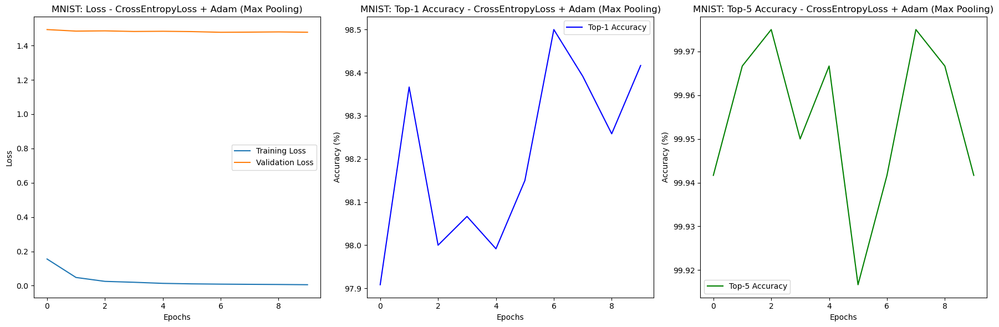

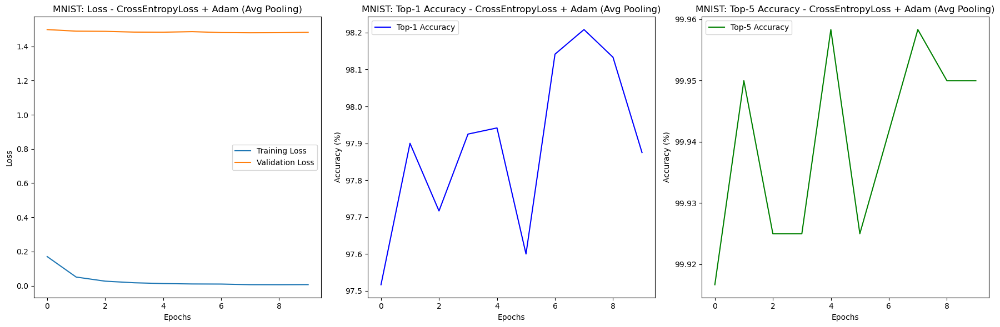

Training MNIST using CrossEntropyLoss + SGD (Max Pooling)


Epochs:  10%|█         | 1/10 [00:35<05:15, 35.06s/epoch]

 Epoch Time: 35.02s, Train Loss: 0.5184, Val Loss: 1.5896, Top 1 Accuracy: 91.89%, Top 5 Accuracy: 99.51%


Epochs:  20%|██        | 2/10 [01:09<04:38, 34.76s/epoch]

 Epoch Time: 34.50s, Train Loss: 0.2317, Val Loss: 1.5606, Top 1 Accuracy: 93.68%, Top 5 Accuracy: 99.66%


Epochs:  30%|███       | 3/10 [01:44<04:05, 35.05s/epoch]

 Epoch Time: 35.35s, Train Loss: 0.1781, Val Loss: 1.5420, Top 1 Accuracy: 94.84%, Top 5 Accuracy: 99.80%


Epochs:  40%|████      | 4/10 [02:20<03:30, 35.12s/epoch]

 Epoch Time: 35.18s, Train Loss: 0.1445, Val Loss: 1.5304, Top 1 Accuracy: 95.50%, Top 5 Accuracy: 99.81%


Epochs:  50%|█████     | 5/10 [02:55<02:55, 35.10s/epoch]

 Epoch Time: 35.04s, Train Loss: 0.1203, Val Loss: 1.5259, Top 1 Accuracy: 95.61%, Top 5 Accuracy: 99.86%


Epochs:  60%|██████    | 6/10 [03:30<02:20, 35.00s/epoch]

 Epoch Time: 34.77s, Train Loss: 0.1047, Val Loss: 1.5123, Top 1 Accuracy: 96.43%, Top 5 Accuracy: 99.89%


Epochs:  70%|███████   | 7/10 [04:04<01:44, 34.86s/epoch]

 Epoch Time: 34.53s, Train Loss: 0.0906, Val Loss: 1.5088, Top 1 Accuracy: 96.88%, Top 5 Accuracy: 99.92%


Epochs:  80%|████████  | 8/10 [04:39<01:09, 34.95s/epoch]

 Epoch Time: 35.10s, Train Loss: 0.0807, Val Loss: 1.5058, Top 1 Accuracy: 96.83%, Top 5 Accuracy: 99.93%


Epochs:  90%|█████████ | 9/10 [05:14<00:34, 34.81s/epoch]

 Epoch Time: 34.46s, Train Loss: 0.0731, Val Loss: 1.5028, Top 1 Accuracy: 97.04%, Top 5 Accuracy: 99.94%


Epochs: 100%|██████████| 10/10 [05:49<00:00, 34.90s/epoch]


 Epoch Time: 34.68s, Train Loss: 0.0660, Val Loss: 1.5016, Top 1 Accuracy: 97.12%, Top 5 Accuracy: 99.93%
Training MNIST using CrossEntropyLoss + SGD (Avg Pooling)


Epochs:  10%|█         | 1/10 [00:37<05:37, 37.50s/epoch]

 Epoch Time: 37.47s, Train Loss: 0.6321, Val Loss: 1.6089, Top 1 Accuracy: 90.59%, Top 5 Accuracy: 99.38%


Epochs:  20%|██        | 2/10 [01:15<05:01, 37.70s/epoch]

 Epoch Time: 37.80s, Train Loss: 0.2754, Val Loss: 1.5762, Top 1 Accuracy: 92.93%, Top 5 Accuracy: 99.53%


Epochs:  30%|███       | 3/10 [01:51<04:17, 36.85s/epoch]

 Epoch Time: 35.81s, Train Loss: 0.2190, Val Loss: 1.5561, Top 1 Accuracy: 94.08%, Top 5 Accuracy: 99.63%


Epochs:  40%|████      | 4/10 [02:26<03:36, 36.07s/epoch]

 Epoch Time: 34.83s, Train Loss: 0.1772, Val Loss: 1.5458, Top 1 Accuracy: 94.61%, Top 5 Accuracy: 99.72%


Epochs:  50%|█████     | 5/10 [03:01<02:58, 35.70s/epoch]

 Epoch Time: 35.01s, Train Loss: 0.1471, Val Loss: 1.5300, Top 1 Accuracy: 95.72%, Top 5 Accuracy: 99.82%


Epochs:  60%|██████    | 6/10 [03:36<02:21, 35.44s/epoch]

 Epoch Time: 34.90s, Train Loss: 0.1242, Val Loss: 1.5227, Top 1 Accuracy: 95.87%, Top 5 Accuracy: 99.83%


Epochs:  70%|███████   | 7/10 [04:10<01:45, 35.26s/epoch]

 Epoch Time: 34.86s, Train Loss: 0.1071, Val Loss: 1.5185, Top 1 Accuracy: 96.06%, Top 5 Accuracy: 99.88%


Epochs:  80%|████████  | 8/10 [04:46<01:10, 35.36s/epoch]

 Epoch Time: 35.52s, Train Loss: 0.0946, Val Loss: 1.5128, Top 1 Accuracy: 96.53%, Top 5 Accuracy: 99.92%


Epochs:  90%|█████████ | 9/10 [05:21<00:35, 35.11s/epoch]

 Epoch Time: 34.53s, Train Loss: 0.0842, Val Loss: 1.5105, Top 1 Accuracy: 96.63%, Top 5 Accuracy: 99.92%


Epochs: 100%|██████████| 10/10 [05:55<00:00, 35.56s/epoch]

 Epoch Time: 34.41s, Train Loss: 0.0754, Val Loss: 1.5071, Top 1 Accuracy: 96.92%, Top 5 Accuracy: 99.92%


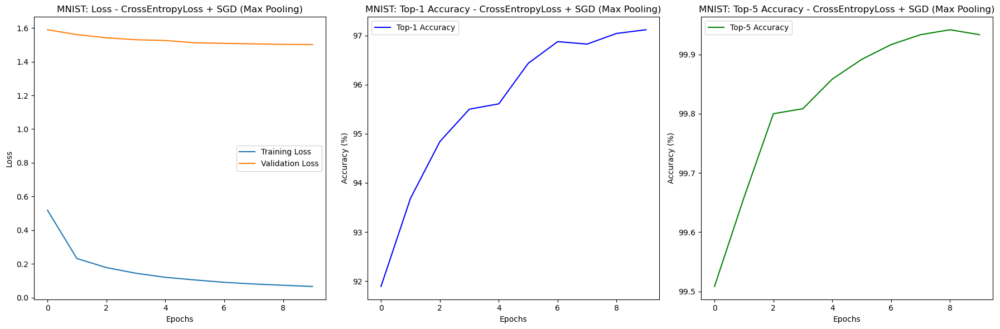

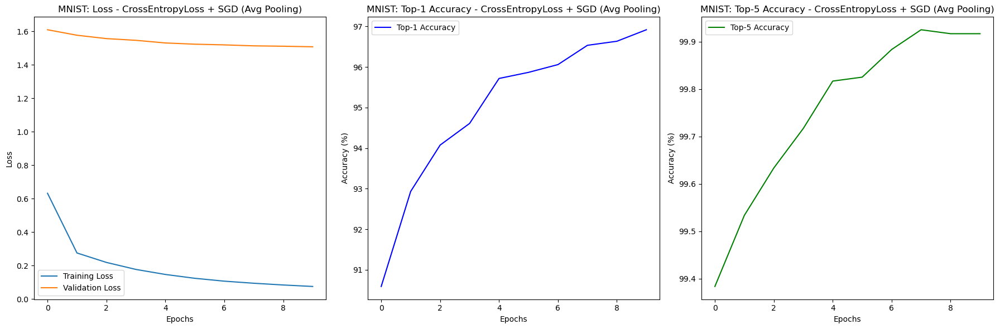

In [21]:
dataset_name, model_class, train_loader, test_loader, num_classes, lr, batch_size, img_size, epoch, channel = models[0]
for criterion in criterions:
    for optimizer_fn in optimizers:
        combination = f'{criterion.__class__.__name__} + {optimizer_fn.__name__}'
        print(f"Training {dataset_name} using {combination} (Max Pooling)")
        
        # Max Pooling Model with Early Stopping
        early_stopping_maxpool = EarlyStopping(patience=5)
        model_maxpool = model_class(num_classes=num_classes, pooling_type='max').to(device)
        model_maxpool.initialize_fc1((channel, img_size, img_size))
        optimizer_maxpool = optimizer_fn(model_maxpool.parameters(), lr=lr)

        # Avg Pooling Model with Early Stopping
        early_stopping_avgpool = EarlyStopping(patience=5)
        model_avgpool = model_class(num_classes=num_classes, pooling_type='avg').to(device)
        model_avgpool.initialize_fc1((channel, img_size, img_size))
        optimizer_avgpool = optimizer_fn(model_avgpool.parameters(), lr=lr)

        # Train both models
        train_losses_maxpool, val_losses_maxpool, top1_accuracies_maxpool, top5_accuracies_maxpool = train_model(
            model_maxpool,
            train_loader, 
            test_loader, 
            criterion, 
            optimizer_maxpool, 
            epoch, 
            early_stopping=early_stopping_maxpool,
            model_name=f'{dataset_name}_maxpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}')
        if train_losses_maxpool:
            best_epoch_maxpool = np.argmax(top1_accuracies_maxpool)
            store_results(
                    dataset_name, 
                    combination, 
                    'Max Pooling', 
                    best_epoch_maxpool + 1,
                    train_losses_maxpool[best_epoch_maxpool], 
                    val_losses_maxpool[best_epoch_maxpool],
                    top1_accuracies_maxpool[best_epoch_maxpool], 
                    top5_accuracies_maxpool[best_epoch_maxpool],
                    model_maxpool,
                    f'{dataset_name}_maxpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}'
            )
        
        ####################################################################################################
        print(f"Training {dataset_name} using {combination} (Avg Pooling)")
        train_losses_avgpool, val_losses_avgpool, top1_accuracies_avgpool, top5_accuracies_avgpool = train_model(
            model_avgpool, 
            train_loader, 
            test_loader, 
            criterion, 
            optimizer_avgpool, 
            epoch, 
            early_stopping=early_stopping_avgpool,
            model_name=f'{dataset_name}_avgpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}')
        
        if train_losses_avgpool:
            best_epoch_avgpool = np.argmax(top1_accuracies_avgpool)
            store_results(
                    dataset_name, 
                    combination, 
                    'Avg Pooling', 
                    best_epoch_avgpool + 1,
                    train_losses_avgpool[best_epoch_avgpool], 
                    val_losses_avgpool[best_epoch_avgpool],
                    top1_accuracies_avgpool[best_epoch_avgpool], 
                    top5_accuracies_avgpool[best_epoch_avgpool],model_avgpool,
                    f'{dataset_name}_avgpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}'
            )
        
        # Plot results
        plot_losses_and_accuracy(
            train_losses_maxpool, val_losses_maxpool, top1_accuracies_maxpool,top5_accuracies_maxpool ,
            combination + ' (Max Pooling)', dataset_name)

        plot_losses_and_accuracy(
            train_losses_avgpool, val_losses_avgpool, top1_accuracies_avgpool, top5_accuracies_avgpool,
            combination + ' (Avg Pooling)', dataset_name)

In [21]:
# Helper function to check if a model checkpoint exists
def checkpoint_exists(model_name, model_save_path):
    model_path = os.path.join(model_save_path, f"{model_name}.pt")
    return os.path.exists(model_path)

Training Caltech-101 using CrossEntropyLoss + Adam (Max Pooling)


Epochs:   0%|          | 0/30 [00:00<?, ?epoch/s]c:\Users\aryan\anaconda3\Lib\site-packages\torch\utils\checkpoint.py:1399: FutureWarning: `torch.cpu.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cpu', args...)` instead.
  with device_autocast_ctx, torch.cpu.amp.autocast(**cpu_autocast_kwargs), recompute_context:  # type: ignore[attr-defined]


 Epoch Time: 69.12s, Train Loss: 4.8549, Val Loss: 4.5195, Top 1 Accuracy: 23.62%, Top 5 Accuracy: 35.37%


Epochs:   3%|▎         | 1/30 [01:11<34:27, 71.28s/epoch]

 Epoch Time: 62.20s, Train Loss: 3.6487, Val Loss: 4.4728, Top 1 Accuracy: 26.27%, Top 5 Accuracy: 39.46%


Epochs:   7%|▋         | 2/30 [02:13<30:53, 66.18s/epoch]

 Epoch Time: 62.36s, Train Loss: 3.3781, Val Loss: 4.4186, Top 1 Accuracy: 28.57%, Top 5 Accuracy: 44.18%


Epochs:  10%|█         | 3/30 [03:16<29:05, 64.63s/epoch]

 Epoch Time: 64.99s, Train Loss: 3.1583, Val Loss: 4.3816, Top 1 Accuracy: 33.35%, Top 5 Accuracy: 48.04%


Epochs:  13%|█▎        | 4/30 [04:22<28:08, 64.95s/epoch]

 Epoch Time: 62.55s, Train Loss: 3.0325, Val Loss: 4.3688, Top 1 Accuracy: 33.76%, Top 5 Accuracy: 50.69%


Epochs:  17%|█▋        | 5/30 [05:25<26:45, 64.24s/epoch]

 Epoch Time: 61.74s, Train Loss: 2.8987, Val Loss: 4.4029, Top 1 Accuracy: 34.27%, Top 5 Accuracy: 49.83%


Epochs:  20%|██        | 6/30 [06:27<25:24, 63.53s/epoch]

 Epoch Time: 61.48s, Train Loss: 2.8306, Val Loss: 4.3604, Top 1 Accuracy: 36.35%, Top 5 Accuracy: 52.19%


Epochs:  23%|██▎       | 7/30 [07:29<24:08, 62.99s/epoch]

 Epoch Time: 61.25s, Train Loss: 2.7760, Val Loss: 4.3558, Top 1 Accuracy: 37.27%, Top 5 Accuracy: 55.24%


Epochs:  27%|██▋       | 8/30 [08:30<22:56, 62.57s/epoch]

 Epoch Time: 61.40s, Train Loss: 2.7173, Val Loss: 4.3519, Top 1 Accuracy: 36.98%, Top 5 Accuracy: 54.15%


Epochs:  30%|███       | 9/30 [09:32<21:49, 62.33s/epoch]

 Epoch Time: 61.26s, Train Loss: 2.6867, Val Loss: 4.3505, Top 1 Accuracy: 38.19%, Top 5 Accuracy: 54.72%


Epochs:  33%|███▎      | 10/30 [10:34<20:42, 62.13s/epoch]

 Epoch Time: 61.23s, Train Loss: 2.6803, Val Loss: 4.3483, Top 1 Accuracy: 37.62%, Top 5 Accuracy: 54.55%


Epochs:  37%|███▋      | 11/30 [11:35<19:37, 61.97s/epoch]

 Epoch Time: 61.01s, Train Loss: 2.6703, Val Loss: 4.3432, Top 1 Accuracy: 38.59%, Top 5 Accuracy: 54.90%


Epochs:  40%|████      | 12/30 [12:37<18:32, 61.80s/epoch]

 Epoch Time: 61.10s, Train Loss: 2.6945, Val Loss: 4.3531, Top 1 Accuracy: 38.19%, Top 5 Accuracy: 55.30%


Epochs:  43%|████▎     | 13/30 [13:38<17:29, 61.71s/epoch]

 Epoch Time: 60.91s, Train Loss: 2.7023, Val Loss: 4.3326, Top 1 Accuracy: 37.67%, Top 5 Accuracy: 54.38%


Epochs:  47%|████▋     | 14/30 [14:40<16:25, 61.59s/epoch]

 Epoch Time: 61.04s, Train Loss: 2.7223, Val Loss: 4.3423, Top 1 Accuracy: 37.15%, Top 5 Accuracy: 54.67%


Epochs:  50%|█████     | 15/30 [15:41<15:23, 61.54s/epoch]

 Epoch Time: 60.93s, Train Loss: 2.7221, Val Loss: 4.3367, Top 1 Accuracy: 37.73%, Top 5 Accuracy: 55.13%


Epochs:  53%|█████▎    | 16/30 [16:42<14:20, 61.47s/epoch]

 Epoch Time: 60.35s, Train Loss: 2.7368, Val Loss: 4.3490, Top 1 Accuracy: 36.35%, Top 5 Accuracy: 53.17%


Epochs:  57%|█████▋    | 17/30 [17:43<13:16, 61.26s/epoch]

 Epoch Time: 60.94s, Train Loss: 2.8005, Val Loss: 4.3616, Top 1 Accuracy: 36.98%, Top 5 Accuracy: 52.59%


Epochs:  60%|██████    | 18/30 [18:44<12:15, 61.28s/epoch]

 Epoch Time: 60.32s, Train Loss: 2.7451, Val Loss: 4.3452, Top 1 Accuracy: 37.62%, Top 5 Accuracy: 54.72%


Epochs:  60%|██████    | 18/30 [19:45<13:10, 65.87s/epoch]

Early stopping at epoch 19
Training Caltech-101 using CrossEntropyLoss + Adam (Avg Pooling)



Epochs:   0%|          | 0/30 [00:00<?, ?epoch/s]

 Epoch Time: 60.25s, Train Loss: 4.8647, Val Loss: 4.6128, Top 1 Accuracy: 9.04%, Top 5 Accuracy: 31.39%


Epochs:   3%|▎         | 1/30 [01:00<29:18, 60.65s/epoch]

 Epoch Time: 60.91s, Train Loss: 4.3061, Val Loss: 4.5982, Top 1 Accuracy: 9.04%, Top 5 Accuracy: 31.39%


Epochs:   7%|▋         | 2/30 [02:01<28:29, 61.04s/epoch]

 Epoch Time: 60.46s, Train Loss: 4.1980, Val Loss: 4.5972, Top 1 Accuracy: 10.08%, Top 5 Accuracy: 31.39%


Epochs:  10%|█         | 3/30 [03:02<27:25, 60.95s/epoch]

 Epoch Time: 60.15s, Train Loss: 4.1958, Val Loss: 4.5962, Top 1 Accuracy: 9.04%, Top 5 Accuracy: 31.39%


Epochs:  13%|█▎        | 4/30 [04:03<26:20, 60.79s/epoch]

 Epoch Time: 60.91s, Train Loss: 4.1925, Val Loss: 4.5960, Top 1 Accuracy: 9.04%, Top 5 Accuracy: 31.39%


Epochs:  17%|█▋        | 5/30 [05:04<25:24, 60.97s/epoch]

 Epoch Time: 60.74s, Train Loss: 4.1928, Val Loss: 4.5967, Top 1 Accuracy: 10.08%, Top 5 Accuracy: 31.39%


Epochs:  20%|██        | 6/30 [06:05<24:24, 61.02s/epoch]

 Epoch Time: 60.58s, Train Loss: 4.1918, Val Loss: 4.5965, Top 1 Accuracy: 9.04%, Top 5 Accuracy: 31.39%


Epochs:  23%|██▎       | 7/30 [07:06<23:23, 61.01s/epoch]

 Epoch Time: 61.35s, Train Loss: 4.1925, Val Loss: 4.5962, Top 1 Accuracy: 9.04%, Top 5 Accuracy: 31.39%


Epochs:  27%|██▋       | 8/30 [08:08<22:27, 61.24s/epoch]

 Epoch Time: 60.60s, Train Loss: 4.1888, Val Loss: 4.5964, Top 1 Accuracy: 9.04%, Top 5 Accuracy: 31.39%


Epochs:  30%|███       | 9/30 [09:09<21:24, 61.17s/epoch]

 Epoch Time: 60.93s, Train Loss: 4.1908, Val Loss: 4.5964, Top 1 Accuracy: 9.04%, Top 5 Accuracy: 31.39%


Epochs:  30%|███       | 9/30 [10:10<23:45, 67.87s/epoch]

Early stopping at epoch 10


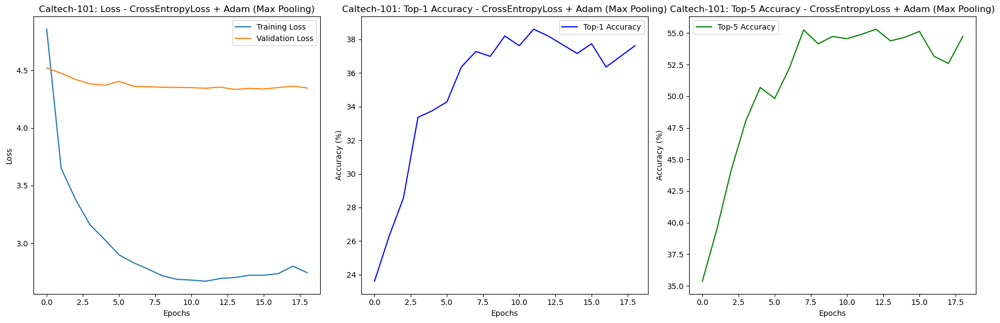

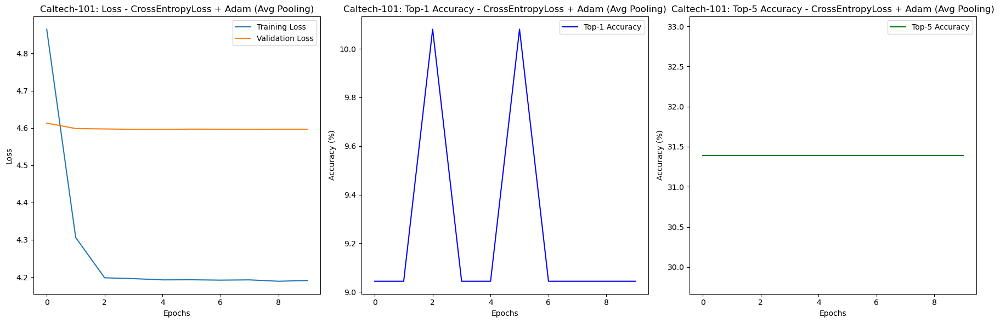

Training Caltech-101 using CrossEntropyLoss + SGD (Max Pooling)


Epochs:   3%|▎         | 1/30 [01:00<29:17, 60.59s/epoch]

 Epoch Time: 60.46s, Train Loss: 3.9940, Val Loss: 4.4902, Top 1 Accuracy: 21.89%, Top 5 Accuracy: 35.94%


Epochs:   7%|▋         | 2/30 [02:00<27:58, 59.94s/epoch]

 Epoch Time: 59.35s, Train Loss: 3.5436, Val Loss: 4.4880, Top 1 Accuracy: 30.41%, Top 5 Accuracy: 42.45%


Epochs:  10%|█         | 3/30 [02:59<26:51, 59.67s/epoch]

 Epoch Time: 59.23s, Train Loss: 3.2846, Val Loss: 4.4432, Top 1 Accuracy: 30.88%, Top 5 Accuracy: 44.01%


Epochs:  13%|█▎        | 4/30 [04:00<26:07, 60.29s/epoch]

 Epoch Time: 61.10s, Train Loss: 3.1024, Val Loss: 4.3872, Top 1 Accuracy: 34.39%, Top 5 Accuracy: 48.44%


Epochs:  17%|█▋        | 5/30 [05:00<25:05, 60.23s/epoch]

 Epoch Time: 60.00s, Train Loss: 2.9533, Val Loss: 4.3841, Top 1 Accuracy: 33.47%, Top 5 Accuracy: 47.24%


Epochs:  20%|██        | 6/30 [05:59<23:50, 59.62s/epoch]

 Epoch Time: 58.30s, Train Loss: 2.8175, Val Loss: 4.3704, Top 1 Accuracy: 37.27%, Top 5 Accuracy: 52.30%


Epochs:  23%|██▎       | 7/30 [06:57<22:42, 59.24s/epoch]

 Epoch Time: 58.32s, Train Loss: 2.7133, Val Loss: 4.3642, Top 1 Accuracy: 38.19%, Top 5 Accuracy: 52.19%


Epochs:  27%|██▋       | 8/30 [07:56<21:37, 59.00s/epoch]

 Epoch Time: 58.34s, Train Loss: 2.6267, Val Loss: 4.3296, Top 1 Accuracy: 39.06%, Top 5 Accuracy: 55.30%


Epochs:  30%|███       | 9/30 [08:55<20:38, 58.96s/epoch]

 Epoch Time: 58.75s, Train Loss: 2.5731, Val Loss: 4.3352, Top 1 Accuracy: 39.86%, Top 5 Accuracy: 55.07%


Epochs:  33%|███▎      | 10/30 [09:54<19:41, 59.10s/epoch]

 Epoch Time: 59.26s, Train Loss: 2.5353, Val Loss: 4.3325, Top 1 Accuracy: 41.19%, Top 5 Accuracy: 56.45%


Epochs:  37%|███▋      | 11/30 [10:52<18:38, 58.87s/epoch]

 Epoch Time: 58.24s, Train Loss: 2.5283, Val Loss: 4.3301, Top 1 Accuracy: 42.17%, Top 5 Accuracy: 55.65%


Epochs:  40%|████      | 12/30 [11:51<17:37, 58.73s/epoch]

 Epoch Time: 58.27s, Train Loss: 2.5451, Val Loss: 4.3335, Top 1 Accuracy: 41.42%, Top 5 Accuracy: 55.93%


Epochs:  40%|████      | 12/30 [12:49<19:14, 64.12s/epoch]

 Epoch Time: 58.10s, Train Loss: 2.5290, Val Loss: 4.3353, Top 1 Accuracy: 41.42%, Top 5 Accuracy: 56.05%
Early stopping at epoch 13


Training Caltech-101 using CrossEntropyLoss + SGD (Avg Pooling)


Epochs:   3%|▎         | 1/30 [00:59<28:42, 59.41s/epoch]

 Epoch Time: 59.28s, Train Loss: 4.0524, Val Loss: 4.4999, Top 1 Accuracy: 21.77%, Top 5 Accuracy: 36.52%


Epochs:   7%|▋         | 2/30 [01:57<27:29, 58.90s/epoch]

 Epoch Time: 58.42s, Train Loss: 3.5248, Val Loss: 4.4539, Top 1 Accuracy: 29.61%, Top 5 Accuracy: 41.94%


Epochs:  10%|█         | 3/30 [02:56<26:27, 58.79s/epoch]

 Epoch Time: 58.53s, Train Loss: 3.2755, Val Loss: 4.4194, Top 1 Accuracy: 30.18%, Top 5 Accuracy: 46.54%


Epochs:  13%|█▎        | 4/30 [03:55<25:29, 58.83s/epoch]

 Epoch Time: 58.76s, Train Loss: 3.0730, Val Loss: 4.4096, Top 1 Accuracy: 33.99%, Top 5 Accuracy: 47.93%


Epochs:  17%|█▋        | 5/30 [04:53<24:25, 58.62s/epoch]

 Epoch Time: 58.11s, Train Loss: 2.9294, Val Loss: 4.4384, Top 1 Accuracy: 33.18%, Top 5 Accuracy: 48.91%


Epochs:  20%|██        | 6/30 [05:51<23:23, 58.46s/epoch]

 Epoch Time: 58.02s, Train Loss: 2.7897, Val Loss: 4.3489, Top 1 Accuracy: 36.18%, Top 5 Accuracy: 53.28%


Epochs:  23%|██▎       | 7/30 [06:50<22:23, 58.43s/epoch]

 Epoch Time: 58.25s, Train Loss: 2.6932, Val Loss: 4.3613, Top 1 Accuracy: 39.00%, Top 5 Accuracy: 53.97%


Epochs:  27%|██▋       | 8/30 [07:48<21:23, 58.34s/epoch]

 Epoch Time: 58.00s, Train Loss: 2.6100, Val Loss: 4.3389, Top 1 Accuracy: 39.46%, Top 5 Accuracy: 55.65%


Epochs:  30%|███       | 9/30 [08:46<20:26, 58.39s/epoch]

 Epoch Time: 58.36s, Train Loss: 2.5462, Val Loss: 4.3390, Top 1 Accuracy: 40.84%, Top 5 Accuracy: 57.95%


Epochs:  33%|███▎      | 10/30 [09:45<19:27, 58.38s/epoch]

 Epoch Time: 58.23s, Train Loss: 2.4998, Val Loss: 4.3384, Top 1 Accuracy: 40.67%, Top 5 Accuracy: 57.66%


Epochs:  37%|███▋      | 11/30 [10:43<18:27, 58.31s/epoch]

 Epoch Time: 58.02s, Train Loss: 2.4955, Val Loss: 4.3350, Top 1 Accuracy: 41.76%, Top 5 Accuracy: 57.09%


Epochs:  40%|████      | 12/30 [11:41<17:30, 58.34s/epoch]

 Epoch Time: 58.26s, Train Loss: 2.4942, Val Loss: 4.3263, Top 1 Accuracy: 42.11%, Top 5 Accuracy: 58.24%


Epochs:  43%|████▎     | 13/30 [12:40<16:32, 58.38s/epoch]

 Epoch Time: 58.35s, Train Loss: 2.4997, Val Loss: 4.3274, Top 1 Accuracy: 42.34%, Top 5 Accuracy: 57.32%


Epochs:  47%|████▋     | 14/30 [13:38<15:35, 58.46s/epoch]

 Epoch Time: 58.51s, Train Loss: 2.5196, Val Loss: 4.3341, Top 1 Accuracy: 40.90%, Top 5 Accuracy: 57.32%


Epochs:  50%|█████     | 15/30 [14:39<14:44, 58.95s/epoch]

 Epoch Time: 59.96s, Train Loss: 2.5285, Val Loss: 4.3166, Top 1 Accuracy: 40.44%, Top 5 Accuracy: 56.45%


Epochs:  53%|█████▎    | 16/30 [15:38<13:48, 59.20s/epoch]

 Epoch Time: 59.65s, Train Loss: 2.5469, Val Loss: 4.3390, Top 1 Accuracy: 34.97%, Top 5 Accuracy: 54.38%


Epochs:  57%|█████▋    | 17/30 [16:37<12:47, 59.05s/epoch]

 Epoch Time: 58.55s, Train Loss: 2.5368, Val Loss: 4.3333, Top 1 Accuracy: 39.29%, Top 5 Accuracy: 55.82%


Epochs:  60%|██████    | 18/30 [17:37<11:50, 59.20s/epoch]

 Epoch Time: 59.42s, Train Loss: 2.4979, Val Loss: 4.3425, Top 1 Accuracy: 40.03%, Top 5 Accuracy: 55.88%


Epochs:  63%|██████▎   | 19/30 [18:36<10:52, 59.34s/epoch]

 Epoch Time: 59.51s, Train Loss: 2.4774, Val Loss: 4.3539, Top 1 Accuracy: 38.19%, Top 5 Accuracy: 55.41%


Epochs:  67%|██████▋   | 20/30 [19:36<09:55, 59.51s/epoch]

 Epoch Time: 59.78s, Train Loss: 2.4258, Val Loss: 4.3129, Top 1 Accuracy: 39.80%, Top 5 Accuracy: 57.49%


Epochs:  70%|███████   | 21/30 [20:35<08:52, 59.22s/epoch]

 Epoch Time: 58.41s, Train Loss: 2.3441, Val Loss: 4.3278, Top 1 Accuracy: 41.94%, Top 5 Accuracy: 58.18%


Epochs:  73%|███████▎  | 22/30 [21:35<07:55, 59.47s/epoch]

 Epoch Time: 59.93s, Train Loss: 2.2901, Val Loss: 4.3257, Top 1 Accuracy: 40.15%, Top 5 Accuracy: 58.24%


Epochs:  77%|███████▋  | 23/30 [22:35<06:57, 59.63s/epoch]

 Epoch Time: 59.88s, Train Loss: 2.2141, Val Loss: 4.2774, Top 1 Accuracy: 42.51%, Top 5 Accuracy: 60.43%


Epochs:  80%|████████  | 24/30 [23:33<05:55, 59.28s/epoch]

 Epoch Time: 58.31s, Train Loss: 2.1581, Val Loss: 4.2868, Top 1 Accuracy: 42.22%, Top 5 Accuracy: 60.14%


Epochs:  83%|████████▎ | 25/30 [24:33<04:57, 59.56s/epoch]

 Epoch Time: 60.11s, Train Loss: 2.0910, Val Loss: 4.2765, Top 1 Accuracy: 44.64%, Top 5 Accuracy: 61.69%


Epochs:  87%|████████▋ | 26/30 [25:35<04:00, 60.05s/epoch]

 Epoch Time: 61.05s, Train Loss: 2.0062, Val Loss: 4.2624, Top 1 Accuracy: 46.14%, Top 5 Accuracy: 63.54%


Epochs:  90%|█████████ | 27/30 [26:36<03:01, 60.49s/epoch]

 Epoch Time: 61.37s, Train Loss: 1.9557, Val Loss: 4.2477, Top 1 Accuracy: 46.54%, Top 5 Accuracy: 63.19%


Epochs:  93%|█████████▎| 28/30 [27:37<02:01, 60.59s/epoch]

 Epoch Time: 60.70s, Train Loss: 1.8973, Val Loss: 4.2486, Top 1 Accuracy: 46.60%, Top 5 Accuracy: 64.80%


Epochs:  97%|█████████▋| 29/30 [28:37<01:00, 60.46s/epoch]

 Epoch Time: 60.01s, Train Loss: 1.8526, Val Loss: 4.2473, Top 1 Accuracy: 47.52%, Top 5 Accuracy: 64.69%


Epochs: 100%|██████████| 30/30 [29:38<00:00, 59.28s/epoch]

 Epoch Time: 60.52s, Train Loss: 1.8190, Val Loss: 4.2371, Top 1 Accuracy: 49.14%, Top 5 Accuracy: 64.80%


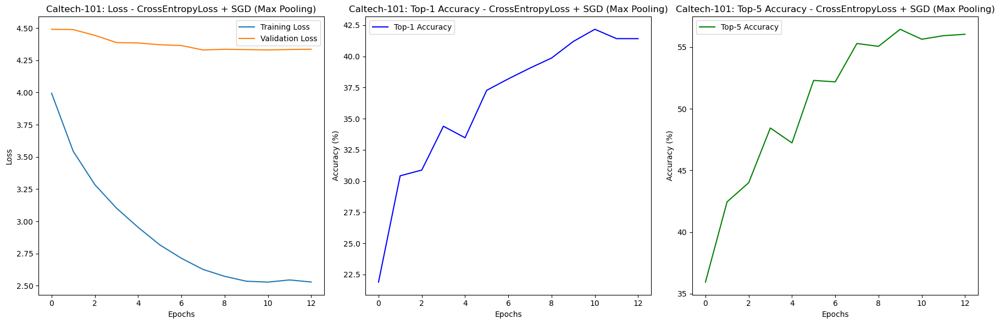

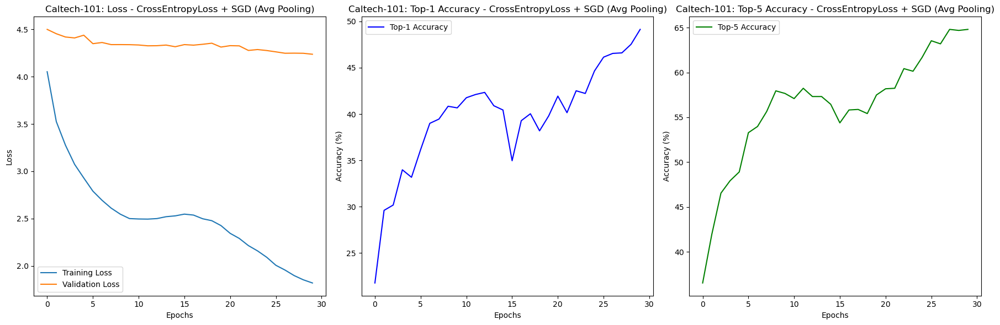

In [22]:
dataset_name, model_class, train_loader, test_loader, num_classes, lrs, batch_size, img_size, epoch, channel = models[1]
adam_lr,sgd_lr=lrs
for criterion in criterions:
    for optimizer_fn in optimizers:
        combination = f'{criterion.__class__.__name__} + {optimizer_fn.__name__}'
    
        # Dynamically set learning rate based on the optimizer being used
        if optimizer_fn == optim.Adam:
            lr = adam_lr  # Set for Adam
        elif optimizer_fn == optim.SGD:
            lr = sgd_lr  # et forS SGD
        else:
            raise ValueError(f"Unknown optimizer: {optimizer_fn}")

        maxpool_model_name = f'{dataset_name}_maxpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}'
        avgpool_model_name = f'{dataset_name}_avgpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}'

        
        # Max Pooling Model with Early Stopping
        print(f"Training {dataset_name} using {combination} (Max Pooling)")
        early_stopping_maxpool = EarlyStopping(patience=5)
        model_maxpool = model_class(num_classes=num_classes, pooling_type='max').to(device)
        model_maxpool.initialize_fc1((channel, img_size, img_size))
        optimizer_maxpool = optimizer_fn(model_maxpool.parameters(), lr=lr, weight_decay=0.001)
        scheduler_maxpool = optim.lr_scheduler.CosineAnnealingLR(optimizer_maxpool, T_max=10, eta_min=0.0001)
        # Train both models
        train_losses_maxpool, val_losses_maxpool, top1_accuracies_maxpool, top5_accuracies_maxpool = train_model(
            model_maxpool,
            train_loader, 
            test_loader, 
            criterion, 
            optimizer_maxpool, 
            epoch, 
            early_stopping=early_stopping_maxpool
            ,scheduler_maxpool=scheduler_maxpool,
            model_name=maxpool_model_name
            )
        if train_losses_maxpool:
            best_epoch_maxpool = np.argmax(top1_accuracies_maxpool)
            store_results(
                    dataset_name,
                    combination,
                    'Max Pooling',
                    best_epoch_maxpool + 1,
                    train_losses_maxpool[best_epoch_maxpool],
                    val_losses_maxpool[best_epoch_maxpool],
                    top1_accuracies_maxpool[best_epoch_maxpool],
                    top5_accuracies_maxpool[best_epoch_maxpool],
                    model_maxpool,
                    maxpool_model_name
            )
    
        ####################################################################################################
    
        print(f"Training {dataset_name} using {combination} (Avg Pooling)")
        # Avg Pooling Model with Early Stopping
        early_stopping_avgpool = EarlyStopping(patience=5)
        model_avgpool = model_class(num_classes=num_classes, pooling_type='avg').to(device)
        model_avgpool.initialize_fc1((channel, img_size, img_size))
        optimizer_avgpool = optimizer_fn(model_avgpool.parameters(), lr=lr, weight_decay=0.001)
        scheduler_avgpool = optim.lr_scheduler.CosineAnnealingLR(optimizer_avgpool, T_max=10, eta_min=0.0001)
        train_losses_avgpool, val_losses_avgpool, top1_accuracies_avgpool, top5_accuracies_avgpool = train_model(
            model_avgpool,
            train_loader,
            test_loader,
            criterion,
            optimizer_avgpool,
            epoch,
            early_stopping=early_stopping_avgpool,
            scheduler_avgpool=scheduler_avgpool,
            model_name=avgpool_model_name
            )
        if train_losses_avgpool:
            best_epoch_avgpool = np.argmax(top1_accuracies_avgpool)
            store_results(
                    dataset_name,
                    combination,
                    'Avg Pooling',
                    best_epoch_avgpool + 1,
                    train_losses_avgpool[best_epoch_avgpool],
                    val_losses_avgpool[best_epoch_avgpool],
                    top1_accuracies_avgpool[best_epoch_avgpool],
                    top5_accuracies_avgpool[best_epoch_avgpool],
                    model_avgpool,
                    avgpool_model_name
            )

        #########################################################################################################
    
        plot_losses_and_accuracy(
            train_losses_maxpool, val_losses_maxpool, top1_accuracies_maxpool, top5_accuracies_maxpool,
            combination + ' (Max Pooling)', dataset_name)

    
        plot_losses_and_accuracy(
            train_losses_avgpool, val_losses_avgpool, top1_accuracies_avgpool, top5_accuracies_avgpool,
            combination + ' (Avg Pooling)', dataset_name)

Training Caltech-101_Deep using CrossEntropyLoss + Adam (Max Pooling)


Epochs:   0%|          | 0/30 [00:00<?, ?epoch/s]

 Epoch Time: 75.05s, Train Loss: 9.0761, Val Loss: 4.5944, Top 1 Accuracy: 10.14%, Top 5 Accuracy: 30.01%


Epochs:   3%|▎         | 1/30 [01:16<36:50, 76.23s/epoch]

 Epoch Time: 74.26s, Train Loss: 4.4818, Val Loss: 4.5971, Top 1 Accuracy: 10.08%, Top 5 Accuracy: 30.88%


Epochs:   7%|▋         | 2/30 [02:30<35:08, 75.31s/epoch]

 Epoch Time: 74.22s, Train Loss: 4.4062, Val Loss: 4.6051, Top 1 Accuracy: 10.08%, Top 5 Accuracy: 31.45%


Epochs:  10%|█         | 3/30 [03:45<33:45, 75.01s/epoch]

 Epoch Time: 74.26s, Train Loss: 4.3577, Val Loss: 4.6071, Top 1 Accuracy: 9.79%, Top 5 Accuracy: 31.22%


Epochs:  13%|█▎        | 4/30 [05:00<32:31, 75.06s/epoch]

 Epoch Time: 74.30s, Train Loss: 4.3343, Val Loss: 4.6094, Top 1 Accuracy: 10.08%, Top 5 Accuracy: 31.39%


Epochs:  17%|█▋        | 5/30 [06:15<31:14, 74.96s/epoch]

 Epoch Time: 73.57s, Train Loss: 4.3050, Val Loss: 4.6082, Top 1 Accuracy: 10.08%, Top 5 Accuracy: 31.39%


Epochs:  17%|█▋        | 5/30 [07:29<37:27, 89.89s/epoch]


Early stopping at epoch 6
Training Caltech-101_Deep using CrossEntropyLoss + Adam (Avg Pooling)


Epochs:   0%|          | 0/30 [00:00<?, ?epoch/s]

 Epoch Time: 74.46s, Train Loss: 8.7226, Val Loss: 4.6084, Top 1 Accuracy: 10.37%, Top 5 Accuracy: 29.72%


Epochs:   3%|▎         | 1/30 [01:14<36:11, 74.89s/epoch]

 Epoch Time: 74.17s, Train Loss: 4.4362, Val Loss: 4.6068, Top 1 Accuracy: 11.23%, Top 5 Accuracy: 31.80%


Epochs:   7%|▋         | 2/30 [02:30<35:03, 75.13s/epoch]

 Epoch Time: 74.30s, Train Loss: 4.3382, Val Loss: 4.5848, Top 1 Accuracy: 16.59%, Top 5 Accuracy: 29.84%


Epochs:  10%|█         | 3/30 [03:44<33:43, 74.94s/epoch]

 Epoch Time: 74.35s, Train Loss: 4.2407, Val Loss: 4.5736, Top 1 Accuracy: 19.87%, Top 5 Accuracy: 33.01%


Epochs:  13%|█▎        | 4/30 [04:59<32:26, 74.87s/epoch]

 Epoch Time: 74.25s, Train Loss: 4.1776, Val Loss: 4.5501, Top 1 Accuracy: 21.14%, Top 5 Accuracy: 32.78%


Epochs:  17%|█▋        | 5/30 [06:14<31:09, 74.79s/epoch]

 Epoch Time: 73.87s, Train Loss: 4.0732, Val Loss: 4.5609, Top 1 Accuracy: 17.86%, Top 5 Accuracy: 32.89%


Epochs:  20%|██        | 6/30 [07:28<29:50, 74.62s/epoch]

 Epoch Time: 74.16s, Train Loss: 3.9714, Val Loss: 4.4817, Top 1 Accuracy: 23.79%, Top 5 Accuracy: 34.79%


Epochs:  23%|██▎       | 7/30 [08:43<28:37, 74.67s/epoch]

 Epoch Time: 74.29s, Train Loss: 3.8420, Val Loss: 4.4724, Top 1 Accuracy: 23.68%, Top 5 Accuracy: 34.85%


Epochs:  27%|██▋       | 8/30 [09:58<27:22, 74.68s/epoch]

 Epoch Time: 74.27s, Train Loss: 3.7550, Val Loss: 4.4461, Top 1 Accuracy: 25.92%, Top 5 Accuracy: 35.60%


Epochs:  30%|███       | 9/30 [11:12<26:08, 74.68s/epoch]

 Epoch Time: 74.09s, Train Loss: 3.7180, Val Loss: 4.4331, Top 1 Accuracy: 27.59%, Top 5 Accuracy: 35.66%


Epochs:  33%|███▎      | 10/30 [12:27<24:52, 74.62s/epoch]

 Epoch Time: 74.67s, Train Loss: 3.6750, Val Loss: 4.4274, Top 1 Accuracy: 28.11%, Top 5 Accuracy: 35.89%


Epochs:  37%|███▋      | 11/30 [13:42<23:40, 74.77s/epoch]

 Epoch Time: 74.56s, Train Loss: 3.6814, Val Loss: 4.4151, Top 1 Accuracy: 28.74%, Top 5 Accuracy: 36.41%


Epochs:  40%|████      | 12/30 [14:57<22:26, 74.83s/epoch]

 Epoch Time: 74.30s, Train Loss: 3.6712, Val Loss: 4.4190, Top 1 Accuracy: 28.80%, Top 5 Accuracy: 36.12%


Epochs:  43%|████▎     | 13/30 [16:12<21:11, 74.80s/epoch]

 Epoch Time: 74.12s, Train Loss: 3.6477, Val Loss: 4.4054, Top 1 Accuracy: 29.21%, Top 5 Accuracy: 37.10%


Epochs:  47%|████▋     | 14/30 [17:26<19:55, 74.72s/epoch]

 Epoch Time: 74.13s, Train Loss: 3.7035, Val Loss: 4.4635, Top 1 Accuracy: 27.19%, Top 5 Accuracy: 35.48%


Epochs:  50%|█████     | 15/30 [18:41<18:40, 74.68s/epoch]

 Epoch Time: 74.35s, Train Loss: 3.7027, Val Loss: 4.4450, Top 1 Accuracy: 28.63%, Top 5 Accuracy: 36.23%


Epochs:  53%|█████▎    | 16/30 [19:56<17:26, 74.75s/epoch]

 Epoch Time: 74.31s, Train Loss: 3.7625, Val Loss: 4.4800, Top 1 Accuracy: 29.67%, Top 5 Accuracy: 36.23%


Epochs:  57%|█████▋    | 17/30 [21:10<16:12, 74.78s/epoch]

 Epoch Time: 76.88s, Train Loss: 3.6659, Val Loss: 4.4351, Top 1 Accuracy: 30.47%, Top 5 Accuracy: 37.85%


Epochs:  60%|██████    | 18/30 [22:28<15:06, 75.56s/epoch]

 Epoch Time: 75.49s, Train Loss: 3.6946, Val Loss: 4.4409, Top 1 Accuracy: 29.09%, Top 5 Accuracy: 37.79%


Epochs:  60%|██████    | 18/30 [23:44<15:49, 79.13s/epoch]

Early stopping at epoch 19


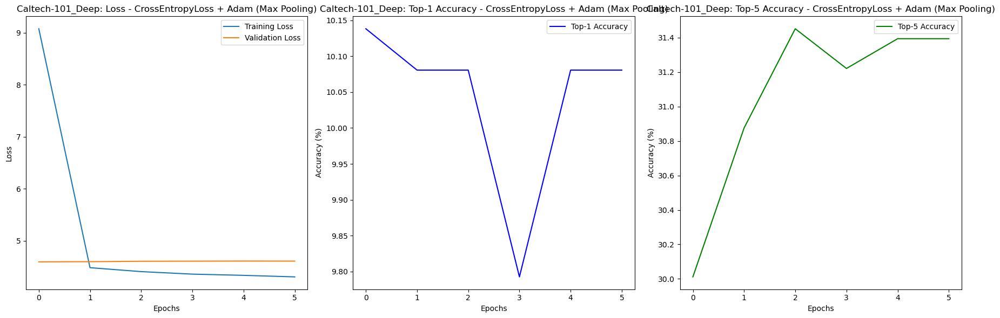

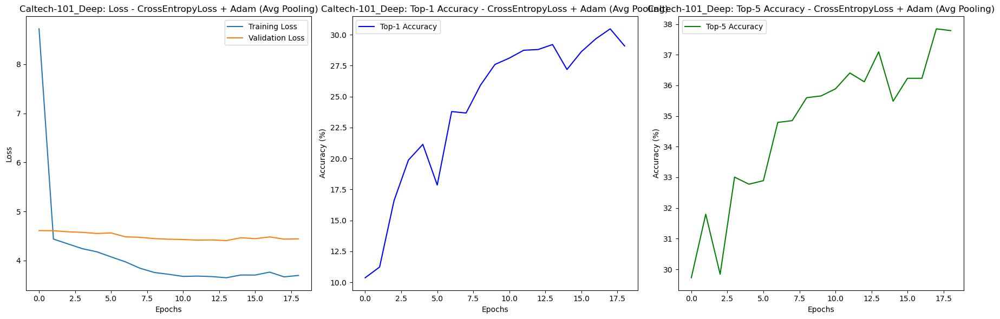

Training Caltech-101_Deep using CrossEntropyLoss + SGD (Max Pooling)


Epochs:   3%|▎         | 1/30 [01:14<36:05, 74.67s/epoch]

 Epoch Time: 74.52s, Train Loss: 3.8092, Val Loss: 4.4463, Top 1 Accuracy: 32.09%, Top 5 Accuracy: 43.89%


Epochs:   7%|▋         | 2/30 [02:28<34:41, 74.32s/epoch]

 Epoch Time: 73.94s, Train Loss: 3.2391, Val Loss: 4.3826, Top 1 Accuracy: 34.62%, Top 5 Accuracy: 53.11%


Epochs:  10%|█         | 3/30 [03:42<33:18, 74.01s/epoch]

 Epoch Time: 73.50s, Train Loss: 2.9555, Val Loss: 4.3397, Top 1 Accuracy: 41.24%, Top 5 Accuracy: 57.37%


Epochs:  13%|█▎        | 4/30 [04:55<31:59, 73.84s/epoch]

 Epoch Time: 73.43s, Train Loss: 2.7231, Val Loss: 4.3155, Top 1 Accuracy: 44.82%, Top 5 Accuracy: 62.90%


Epochs:  17%|█▋        | 5/30 [06:10<30:48, 73.96s/epoch]

 Epoch Time: 74.03s, Train Loss: 2.5218, Val Loss: 4.2770, Top 1 Accuracy: 47.93%, Top 5 Accuracy: 65.61%


Epochs:  20%|██        | 6/30 [07:24<29:35, 73.98s/epoch]

 Epoch Time: 73.87s, Train Loss: 2.3621, Val Loss: 4.2718, Top 1 Accuracy: 50.98%, Top 5 Accuracy: 69.01%


Epochs:  23%|██▎       | 7/30 [08:38<28:23, 74.05s/epoch]

 Epoch Time: 74.05s, Train Loss: 2.2325, Val Loss: 4.2395, Top 1 Accuracy: 51.73%, Top 5 Accuracy: 71.66%


Epochs:  27%|██▋       | 8/30 [09:51<27:05, 73.88s/epoch]

 Epoch Time: 73.37s, Train Loss: 2.1390, Val Loss: 4.2419, Top 1 Accuracy: 53.17%, Top 5 Accuracy: 73.39%


Epochs:  30%|███       | 9/30 [11:05<25:49, 73.77s/epoch]

 Epoch Time: 73.39s, Train Loss: 2.0930, Val Loss: 4.2298, Top 1 Accuracy: 53.97%, Top 5 Accuracy: 74.42%


Epochs:  33%|███▎      | 10/30 [12:18<24:33, 73.65s/epoch]

 Epoch Time: 73.25s, Train Loss: 2.0550, Val Loss: 4.2294, Top 1 Accuracy: 55.13%, Top 5 Accuracy: 74.83%


Epochs:  37%|███▋      | 11/30 [13:31<23:14, 73.38s/epoch]

 Epoch Time: 72.61s, Train Loss: 2.0409, Val Loss: 4.2294, Top 1 Accuracy: 55.47%, Top 5 Accuracy: 73.10%


Epochs:  40%|████      | 12/30 [14:45<22:01, 73.41s/epoch]

 Epoch Time: 73.33s, Train Loss: 2.0377, Val Loss: 4.2250, Top 1 Accuracy: 55.47%, Top 5 Accuracy: 74.71%


Epochs:  43%|████▎     | 13/30 [15:57<20:44, 73.21s/epoch]

 Epoch Time: 72.63s, Train Loss: 2.0497, Val Loss: 4.2271, Top 1 Accuracy: 54.72%, Top 5 Accuracy: 74.83%


Epochs:  47%|████▋     | 14/30 [17:10<19:28, 73.01s/epoch]

 Epoch Time: 72.39s, Train Loss: 2.0417, Val Loss: 4.2209, Top 1 Accuracy: 55.41%, Top 5 Accuracy: 74.88%


Epochs:  50%|█████     | 15/30 [18:23<18:18, 73.20s/epoch]

 Epoch Time: 73.52s, Train Loss: 2.0368, Val Loss: 4.2280, Top 1 Accuracy: 55.24%, Top 5 Accuracy: 74.88%


Epochs:  53%|█████▎    | 16/30 [19:38<17:10, 73.63s/epoch]

 Epoch Time: 74.47s, Train Loss: 2.0041, Val Loss: 4.2189, Top 1 Accuracy: 56.45%, Top 5 Accuracy: 75.29%


Epochs:  57%|█████▋    | 17/30 [20:52<15:57, 73.69s/epoch]

 Epoch Time: 73.70s, Train Loss: 1.9841, Val Loss: 4.2161, Top 1 Accuracy: 54.55%, Top 5 Accuracy: 73.85%


Epochs:  60%|██████    | 18/30 [22:06<14:45, 73.75s/epoch]

 Epoch Time: 73.75s, Train Loss: 1.9094, Val Loss: 4.2118, Top 1 Accuracy: 56.74%, Top 5 Accuracy: 75.52%


Epochs:  63%|██████▎   | 19/30 [23:20<13:31, 73.80s/epoch]

 Epoch Time: 73.77s, Train Loss: 1.8741, Val Loss: 4.2295, Top 1 Accuracy: 56.28%, Top 5 Accuracy: 75.35%


Epochs:  67%|██████▋   | 20/30 [24:35<12:22, 74.30s/epoch]

 Epoch Time: 75.31s, Train Loss: 1.8178, Val Loss: 4.1721, Top 1 Accuracy: 59.68%, Top 5 Accuracy: 78.00%


Epochs:  70%|███████   | 21/30 [25:50<11:11, 74.56s/epoch]

 Epoch Time: 75.04s, Train Loss: 1.7435, Val Loss: 4.1650, Top 1 Accuracy: 60.31%, Top 5 Accuracy: 78.40%


Epochs:  73%|███████▎  | 22/30 [27:05<09:57, 74.72s/epoch]

 Epoch Time: 74.96s, Train Loss: 1.6455, Val Loss: 4.1864, Top 1 Accuracy: 58.76%, Top 5 Accuracy: 77.59%


Epochs:  77%|███████▋  | 23/30 [28:20<08:43, 74.72s/epoch]

 Epoch Time: 74.58s, Train Loss: 1.5539, Val Loss: 4.1207, Top 1 Accuracy: 62.38%, Top 5 Accuracy: 81.74%


Epochs:  80%|████████  | 24/30 [29:35<07:28, 74.68s/epoch]

 Epoch Time: 74.44s, Train Loss: 1.4761, Val Loss: 4.1163, Top 1 Accuracy: 62.04%, Top 5 Accuracy: 82.03%


Epochs:  83%|████████▎ | 25/30 [30:49<06:13, 74.61s/epoch]

 Epoch Time: 74.31s, Train Loss: 1.4018, Val Loss: 4.1060, Top 1 Accuracy: 64.40%, Top 5 Accuracy: 82.49%


Epochs:  87%|████████▋ | 26/30 [32:04<04:58, 74.55s/epoch]

 Epoch Time: 74.27s, Train Loss: 1.3237, Val Loss: 4.0919, Top 1 Accuracy: 65.50%, Top 5 Accuracy: 84.27%


Epochs:  90%|█████████ | 27/30 [33:18<03:43, 74.47s/epoch]

 Epoch Time: 74.14s, Train Loss: 1.2727, Val Loss: 4.0850, Top 1 Accuracy: 66.01%, Top 5 Accuracy: 85.54%


Epochs:  93%|█████████▎| 28/30 [34:32<02:28, 74.30s/epoch]

 Epoch Time: 73.78s, Train Loss: 1.2104, Val Loss: 4.0728, Top 1 Accuracy: 66.88%, Top 5 Accuracy: 85.20%


Epochs:  97%|█████████▋| 29/30 [35:46<01:14, 74.13s/epoch]

 Epoch Time: 73.58s, Train Loss: 1.1690, Val Loss: 4.0673, Top 1 Accuracy: 67.63%, Top 5 Accuracy: 84.79%


Epochs: 100%|██████████| 30/30 [36:58<00:00, 73.96s/epoch]

 Epoch Time: 72.52s, Train Loss: 1.1607, Val Loss: 4.0607, Top 1 Accuracy: 67.68%, Top 5 Accuracy: 86.00%


Training Caltech-101_Deep using CrossEntropyLoss + SGD (Avg Pooling)


Epochs:   3%|▎         | 1/30 [01:13<35:43, 73.92s/epoch]

 Epoch Time: 73.77s, Train Loss: 3.7444, Val Loss: 4.4787, Top 1 Accuracy: 30.59%, Top 5 Accuracy: 46.03%


Epochs:   7%|▋         | 2/30 [02:27<34:31, 73.99s/epoch]

 Epoch Time: 73.90s, Train Loss: 3.1975, Val Loss: 4.3931, Top 1 Accuracy: 31.34%, Top 5 Accuracy: 50.17%


Epochs:  10%|█         | 3/30 [03:41<33:10, 73.71s/epoch]

 Epoch Time: 73.25s, Train Loss: 2.9114, Val Loss: 4.3552, Top 1 Accuracy: 39.00%, Top 5 Accuracy: 57.95%


Epochs:  13%|█▎        | 4/30 [04:55<31:56, 73.70s/epoch]

 Epoch Time: 73.53s, Train Loss: 2.6817, Val Loss: 4.3214, Top 1 Accuracy: 42.45%, Top 5 Accuracy: 61.00%


Epochs:  17%|█▋        | 5/30 [06:08<30:44, 73.77s/epoch]

 Epoch Time: 73.76s, Train Loss: 2.5249, Val Loss: 4.2968, Top 1 Accuracy: 44.18%, Top 5 Accuracy: 62.56%


Epochs:  20%|██        | 6/30 [07:23<29:35, 73.97s/epoch]

 Epoch Time: 74.23s, Train Loss: 2.3686, Val Loss: 4.2878, Top 1 Accuracy: 47.64%, Top 5 Accuracy: 66.94%


Epochs:  23%|██▎       | 7/30 [08:37<28:21, 73.97s/epoch]

 Epoch Time: 73.83s, Train Loss: 2.2550, Val Loss: 4.2860, Top 1 Accuracy: 51.09%, Top 5 Accuracy: 70.33%


Epochs:  27%|██▋       | 8/30 [09:50<27:03, 73.82s/epoch]

 Epoch Time: 73.35s, Train Loss: 2.1809, Val Loss: 4.2481, Top 1 Accuracy: 51.90%, Top 5 Accuracy: 70.45%


Epochs:  30%|███       | 9/30 [11:04<25:48, 73.76s/epoch]

 Epoch Time: 73.50s, Train Loss: 2.1211, Val Loss: 4.2486, Top 1 Accuracy: 52.88%, Top 5 Accuracy: 71.95%


Epochs:  33%|███▎      | 10/30 [12:17<24:32, 73.64s/epoch]

 Epoch Time: 73.24s, Train Loss: 2.1027, Val Loss: 4.2475, Top 1 Accuracy: 53.40%, Top 5 Accuracy: 71.72%


Epochs:  37%|███▋      | 11/30 [13:31<23:17, 73.57s/epoch]

 Epoch Time: 73.26s, Train Loss: 2.0801, Val Loss: 4.2489, Top 1 Accuracy: 52.71%, Top 5 Accuracy: 71.77%


Epochs:  40%|████      | 12/30 [14:45<22:09, 73.84s/epoch]

 Epoch Time: 74.32s, Train Loss: 2.0791, Val Loss: 4.2417, Top 1 Accuracy: 53.00%, Top 5 Accuracy: 72.06%


Epochs:  43%|████▎     | 13/30 [15:59<20:53, 73.76s/epoch]

 Epoch Time: 73.44s, Train Loss: 2.0931, Val Loss: 4.2408, Top 1 Accuracy: 53.97%, Top 5 Accuracy: 71.60%


Epochs:  47%|████▋     | 14/30 [17:13<19:41, 73.86s/epoch]

 Epoch Time: 73.94s, Train Loss: 2.0759, Val Loss: 4.2459, Top 1 Accuracy: 53.00%, Top 5 Accuracy: 72.00%


Epochs:  50%|█████     | 15/30 [18:27<18:28, 73.89s/epoch]

 Epoch Time: 73.84s, Train Loss: 2.0545, Val Loss: 4.2639, Top 1 Accuracy: 53.86%, Top 5 Accuracy: 73.33%


Epochs:  53%|█████▎    | 16/30 [19:42<17:19, 74.22s/epoch]

 Epoch Time: 74.86s, Train Loss: 2.0371, Val Loss: 4.2528, Top 1 Accuracy: 49.88%, Top 5 Accuracy: 69.18%


Epochs:  57%|█████▋    | 17/30 [20:57<16:08, 74.47s/epoch]

 Epoch Time: 74.89s, Train Loss: 2.0047, Val Loss: 4.2189, Top 1 Accuracy: 55.30%, Top 5 Accuracy: 73.62%


Epochs:  60%|██████    | 18/30 [22:11<14:54, 74.54s/epoch]

 Epoch Time: 74.57s, Train Loss: 1.9495, Val Loss: 4.3192, Top 1 Accuracy: 48.33%, Top 5 Accuracy: 67.86%


Epochs:  63%|██████▎   | 19/30 [23:26<13:39, 74.48s/epoch]

 Epoch Time: 74.19s, Train Loss: 1.8887, Val Loss: 4.2104, Top 1 Accuracy: 52.94%, Top 5 Accuracy: 73.73%


Epochs:  67%|██████▋   | 20/30 [24:40<12:24, 74.43s/epoch]

 Epoch Time: 74.19s, Train Loss: 1.8194, Val Loss: 4.1754, Top 1 Accuracy: 56.91%, Top 5 Accuracy: 75.92%


Epochs:  70%|███████   | 21/30 [25:55<11:10, 74.47s/epoch]

 Epoch Time: 74.44s, Train Loss: 1.7598, Val Loss: 4.1843, Top 1 Accuracy: 59.04%, Top 5 Accuracy: 78.17%


Epochs:  73%|███████▎  | 22/30 [27:09<09:55, 74.45s/epoch]

 Epoch Time: 74.25s, Train Loss: 1.6613, Val Loss: 4.1949, Top 1 Accuracy: 57.49%, Top 5 Accuracy: 75.46%


Epochs:  77%|███████▋  | 23/30 [28:24<08:42, 74.70s/epoch]

 Epoch Time: 75.14s, Train Loss: 1.5821, Val Loss: 4.1899, Top 1 Accuracy: 57.95%, Top 5 Accuracy: 78.28%


Epochs:  80%|████████  | 24/30 [29:40<07:29, 74.95s/epoch]

 Epoch Time: 75.39s, Train Loss: 1.5000, Val Loss: 4.1499, Top 1 Accuracy: 60.37%, Top 5 Accuracy: 78.97%


Epochs:  83%|████████▎ | 25/30 [30:56<06:15, 75.16s/epoch]

 Epoch Time: 75.51s, Train Loss: 1.4348, Val Loss: 4.1344, Top 1 Accuracy: 62.10%, Top 5 Accuracy: 80.53%


Epochs:  87%|████████▋ | 26/30 [32:11<05:00, 75.24s/epoch]

 Epoch Time: 75.28s, Train Loss: 1.3591, Val Loss: 4.1170, Top 1 Accuracy: 63.19%, Top 5 Accuracy: 81.51%


Epochs:  90%|█████████ | 27/30 [33:26<03:45, 75.27s/epoch]

 Epoch Time: 75.22s, Train Loss: 1.2937, Val Loss: 4.1038, Top 1 Accuracy: 64.40%, Top 5 Accuracy: 82.32%


Epochs:  93%|█████████▎| 28/30 [34:42<02:30, 75.33s/epoch]

 Epoch Time: 75.33s, Train Loss: 1.2645, Val Loss: 4.1056, Top 1 Accuracy: 64.46%, Top 5 Accuracy: 82.32%


Epochs:  97%|█████████▋| 29/30 [35:57<01:15, 75.30s/epoch]

 Epoch Time: 75.09s, Train Loss: 1.2112, Val Loss: 4.0998, Top 1 Accuracy: 65.90%, Top 5 Accuracy: 83.64%


Epochs: 100%|██████████| 30/30 [37:12<00:00, 74.40s/epoch]

 Epoch Time: 74.46s, Train Loss: 1.1991, Val Loss: 4.0952, Top 1 Accuracy: 66.01%, Top 5 Accuracy: 83.70%


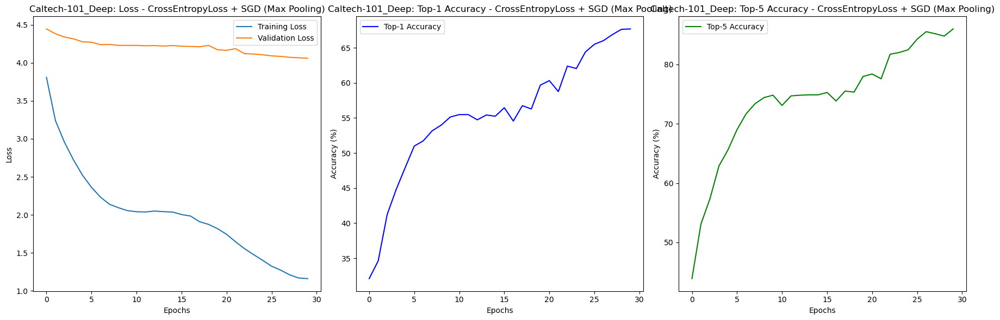

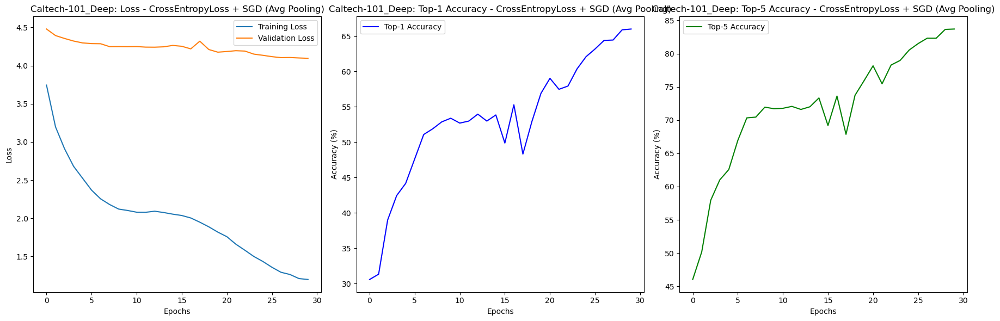

In [23]:
dataset_name, model_class, train_loader, test_loader, num_classes, lrs, batch_size, img_size, epoch, channel = models[2]
adam_lr,sgd_lr=lrs
for criterion in criterions:
    for optimizer_fn in optimizers:
        combination = f'{criterion.__class__.__name__} + {optimizer_fn.__name__}'
        print(f"Training {dataset_name} using {combination} (Max Pooling)")
        
        # Dynamically set learning rate based on the optimizer being used
        if optimizer_fn == optim.Adam:
            lr = adam_lr  # Set for Adam
        elif optimizer_fn == optim.SGD:
            lr = sgd_lr  # et forS SGD
        else:
            raise ValueError(f"Unknown optimizer: {optimizer_fn}")
        
        # Max Pooling Model with Early Stopping
        early_stopping_maxpool = EarlyStopping(patience=5)
        model_maxpool = model_class(num_classes=num_classes, pooling_type='max').to(device)
        model_maxpool.initialize_fc1((channel, img_size, img_size))
        optimizer_maxpool = optimizer_fn(model_maxpool.parameters(), lr=lr, weight_decay=0.001)  # L2 Regularization
        scheduler_maxpool = optim.lr_scheduler.CosineAnnealingLR(optimizer_maxpool, T_max=10, eta_min=0.0001)

        # Avg Pooling Model with Early Stopping
        early_stopping_avgpool = EarlyStopping(patience=5)
        model_avgpool = model_class(num_classes=num_classes, pooling_type='avg').to(device)
        model_avgpool.initialize_fc1((channel, img_size, img_size))
        optimizer_avgpool = optimizer_fn(model_avgpool.parameters(), lr=lr, weight_decay=0.001)
        scheduler_avgpool = optim.lr_scheduler.CosineAnnealingLR(optimizer_avgpool, T_max=10, eta_min=0.0001)

        
        # Train both models
        train_losses_maxpool, val_losses_maxpool, top1_accuracies_maxpool, top5_accuracies_maxpool = train_model(
            model_maxpool,
            train_loader,
            test_loader,
            criterion,
            optimizer_maxpool,
            epoch,
            early_stopping=early_stopping_maxpool,
            scheduler_maxpool=scheduler_maxpool,
            model_name=f'{dataset_name}_maxpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}'
            )
        if train_losses_maxpool:
            best_epoch_maxpool = np.argmax(top1_accuracies_maxpool)
            store_results(
                    dataset_name,
                    combination,
                    'Max Pooling',
                    best_epoch_maxpool + 1,
                    train_losses_maxpool[best_epoch_maxpool],
                    val_losses_maxpool[best_epoch_maxpool],
                    top1_accuracies_maxpool[best_epoch_maxpool],
                    top5_accuracies_maxpool[best_epoch_maxpool],
                    model_maxpool,
                    f'{dataset_name}_maxpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}'
            )
        # check_model_device()
        ####################################################################################################
        print(f"Training {dataset_name} using {combination} (Avg Pooling)")
        train_losses_avgpool, val_losses_avgpool, top1_accuracies_avgpool, top5_accuracies_avgpool = train_model(
            model_avgpool,
            train_loader,
            test_loader,
            criterion,
            optimizer_avgpool,
            epoch,
            early_stopping=early_stopping_avgpool,
            scheduler_avgpool=scheduler_avgpool,
            model_name=f'{dataset_name}_avgpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}'
            )
        if train_losses_avgpool:
            best_epoch_avgpool = np.argmax(top1_accuracies_avgpool)
            store_results(
                    dataset_name,
                    combination,
                    'Avg Pooling',
                    best_epoch_avgpool + 1,
                    train_losses_avgpool[best_epoch_avgpool],
                    val_losses_avgpool[best_epoch_avgpool],
                    top1_accuracies_avgpool[best_epoch_avgpool],
                    top5_accuracies_avgpool[best_epoch_avgpool],
                    model_avgpool,
                    f'{dataset_name}_avgpool_{criterion.__class__.__name__}_{optimizer_fn.__name__}'
            )
        # check_model_device()
        
        # Plot results
        plot_losses_and_accuracy(
            train_losses_maxpool, val_losses_maxpool, top1_accuracies_maxpool, top5_accuracies_maxpool, 
            combination + ' (Max Pooling)', dataset_name)

        plot_losses_and_accuracy(
            train_losses_avgpool, val_losses_avgpool,top1_accuracies_avgpool, top5_accuracies_avgpool, 
            combination + ' (Avg Pooling)', dataset_name)

In [24]:
len(results)

10

In [25]:
# Convert results dictionary to DataFrame
save_results_to_parquet(results)

In [26]:
results_df=load_results_from_parquet()

# Find the best combination for each dataset based on validation accuracy
best_results_1 = results_df.loc[results_df.groupby('dataset')['top1_accuracy'].idxmax()]

print("\n--- Final Best Model Report for top1 ---")
print(best_results_1[['dataset', 'combination', 'pooling', 'top1_accuracy']])

best_results_5 = results_df.loc[results_df.groupby('dataset')['top5_accuracy'].idxmax()]
print("\n--- Final Best Model Report for top5 ---")
print(best_results_5[['dataset', 'combination', 'pooling', 'top5_accuracy']])


--- Final Best Model Report for top1 ---
            dataset             combination      pooling  top1_accuracy
3       Caltech-101  CrossEntropyLoss + SGD  Avg Pooling      49.135945
6  Caltech-101_Deep  CrossEntropyLoss + SGD  Max Pooling      67.684332

--- Final Best Model Report for top5 ---
            dataset             combination      pooling  top5_accuracy
3       Caltech-101  CrossEntropyLoss + SGD  Avg Pooling      64.804147
6  Caltech-101_Deep  CrossEntropyLoss + SGD  Max Pooling      86.002304


In [27]:
results_df

,dataset,combination,pooling,best_epoch,train_loss,val_loss,top1_accuracy,top5_accuracy,model_name,model_path
0,Caltech-101,CrossEntropyLoss + Adam,Max Pooling,12,2.670322,4.343160,38.594470,54.896313,Caltech-101_maxpool_CrossEntropyLoss_Adam,model_checkpoints/Caltech-101_maxpool_CrossEnt...
1,Caltech-101,CrossEntropyLoss + Adam,Avg Pooling,3,4.198033,4.597195,10.080645,31.394009,Caltech-101_avgpool_CrossEntropyLoss_Adam,model_checkpoints/Caltech-101_avgpool_CrossEnt...
2,Caltech-101,CrossEntropyLoss + SGD,Max Pooling,11,2.528337,4.330114,42.165899,55.645161,Caltech-101_maxpool_CrossEntropyLoss_SGD,model_checkpoints/Caltech-101_maxpool_CrossEnt...
3,Caltech-101,CrossEntropyLoss + SGD,Avg Pooling,30,1.819000,4.237104,49.135945,64.804147,Caltech-101_avgpool_CrossEntropyLoss_SGD,model_checkpoints/Caltech-101_avgpool_CrossEnt...
4,Caltech-101_Deep,CrossEntropyLoss + Adam,Max Pooling,1,9.076149,4.594354,10.138249,30.011521,Caltech-101_Deep_maxpool_CrossEntropyLoss_Adam,model_checkpoints/Caltech-101_Deep_maxpool_Cro...
5,Caltech-101_Deep,CrossEntropyLoss + Adam,Avg Pooling,18,3.665921,4.435144,30.472350,37.845622,Caltech-101_Deep_avgpool_CrossEntropyLoss_Adam,model_checkpoints/Caltech-101_Deep_avgpool_Cro...
6,Caltech-101_Deep,CrossEntropyLoss + SGD,Max Pooling,30,1.160717,4.060746,67.684332,86.002304,Caltech-101_Deep_maxpool_CrossEntropyLoss_SGD,model_checkpoints/Caltech-101_Deep_maxpool_Cro...
7,Caltech-101_Deep,CrossEntropyLoss + SGD,Avg Pooling,30,1.199138,4.095156,66.013825,83.698157,Caltech-101_Deep_avgpool_CrossEntropyLoss_SGD,model_checkpoints/Caltech-101_Deep_avgpool_Cro...


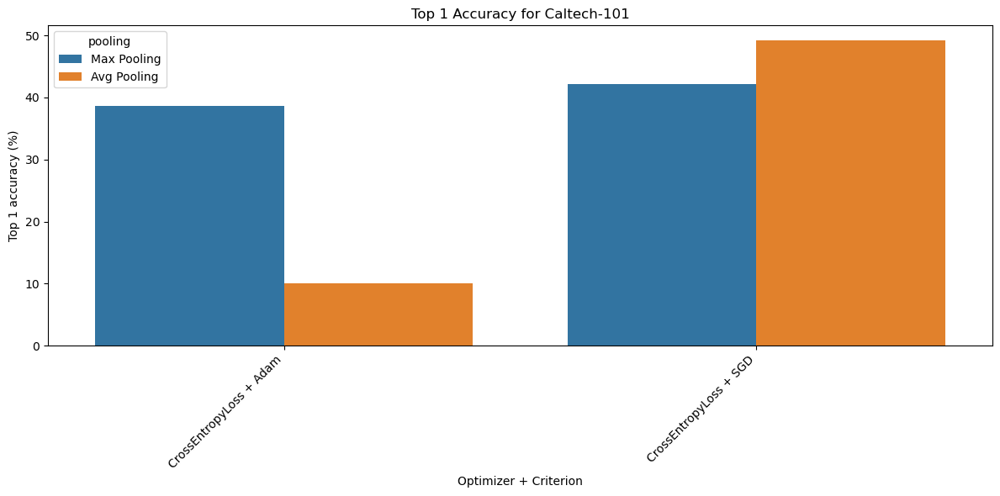

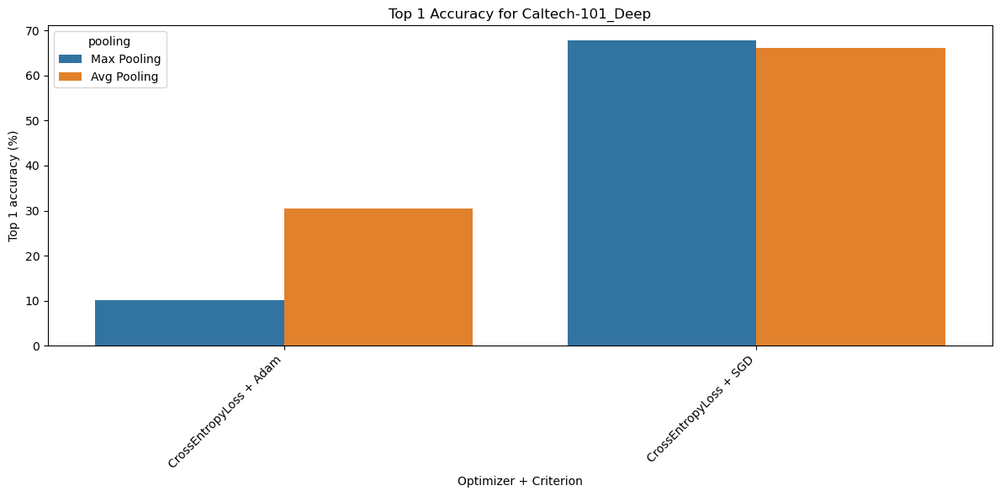

In [28]:
plot_df = results_df.copy()

# Now proceed with plotting as you initially planned
for dataset_name in plot_df['dataset'].unique():
    dataset_df = plot_df[plot_df['dataset'] == dataset_name]
    plt.figure(figsize=(12, 6))
    sns.barplot(x='combination', y='top1_accuracy', hue='pooling', data=dataset_df)
    plt.title(f'Top 1 Accuracy for {dataset_name}')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Top 1 accuracy (%)')
    plt.xlabel('Optimizer + Criterion')
    plt.tight_layout()
    plt.show()

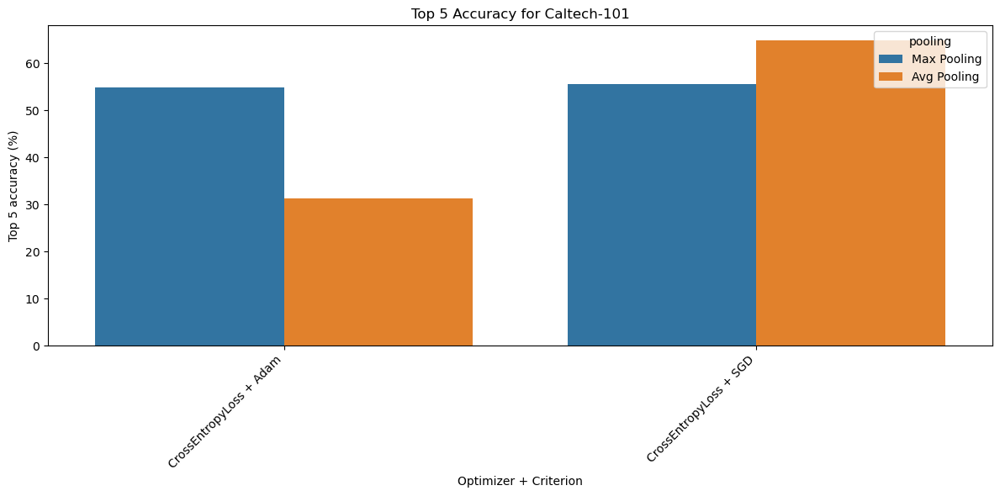

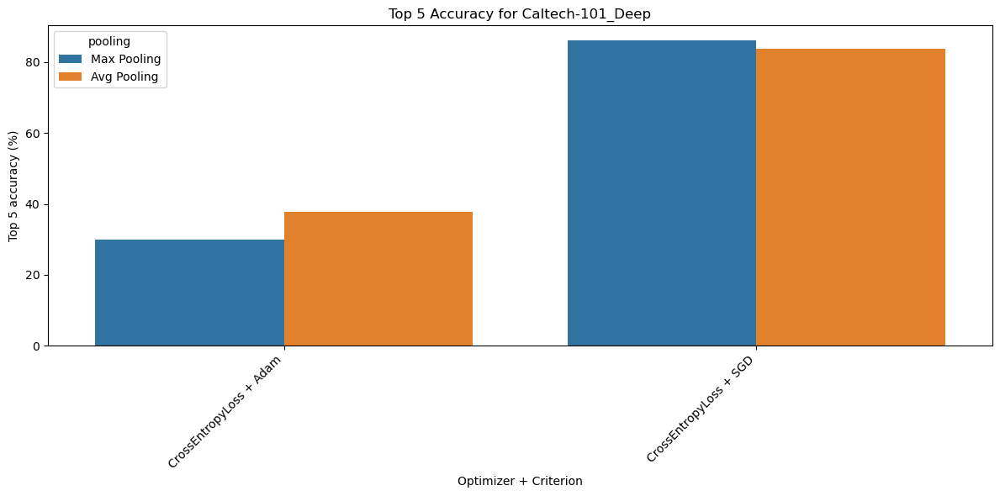

In [29]:
for dataset_name in plot_df['dataset'].unique():
    dataset_df = plot_df[plot_df['dataset'] == dataset_name]
    plt.figure(figsize=(12, 6))
    sns.barplot(x='combination', y='top5_accuracy', hue='pooling', data=dataset_df)
    plt.title(f'Top 5 Accuracy for {dataset_name}')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Top 5 accuracy (%)')
    plt.xlabel('Optimizer + Criterion')
    plt.tight_layout()
    plt.show()

In [30]:
def visualize_all_feature_maps(model, sample_image):
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        output, feature_maps = model(sample_image, return_feature_maps=True)

    for i, fmap in enumerate(feature_maps):
        num_maps = fmap.size(1)
        grid_size = int(np.ceil(np.sqrt(num_maps)))
        fig, axs = plt.subplots(grid_size, grid_size, figsize=(20, 20))
        
        for j in range(num_maps):
            if j < num_maps:
                ax = axs[j // grid_size, j % grid_size]
                ax.imshow(fmap[0, j].cpu().detach().numpy(), cmap='viridis')
                ax.axis('off')

        plt.suptitle(f"Feature Maps after Layer {i+1}", fontsize=16)
        plt.tight_layout()
        plt.show()


In [31]:
# For MNIST:
mnist_sample_image, _ = next(iter(mnist_test_loader))
mnist_sample_image = mnist_sample_image.to(device)

# Retrieve the best model path for MNIST (based on validation accuracy)
best_mnist_model_path = best_results_1[best_results_1['dataset'] == 'MNIST']['model_path'].values[0]

# Initialize a new instance of the MNISTModel
best_mnist_model = MNISTModel(num_classes=10).to(device)

# Initialize fc1 layer before loading the state dict
best_mnist_model.initialize_fc1((MNIST_CHANNEL, MNIST_IMG_SIZE, MNIST_IMG_SIZE))

# Load the model checkpoint and rename the variable to avoid conflict with torch.utils.checkpoint
model_checkpoint_dict = torch.load(best_mnist_model_path, weights_only=True)  # Use a different variable name
best_mnist_model.load_state_dict(model_checkpoint_dict)

# Call visualization
visualize_all_feature_maps(best_mnist_model, mnist_sample_image)


IndexError: index 0 is out of bounds for axis 0 with size 0

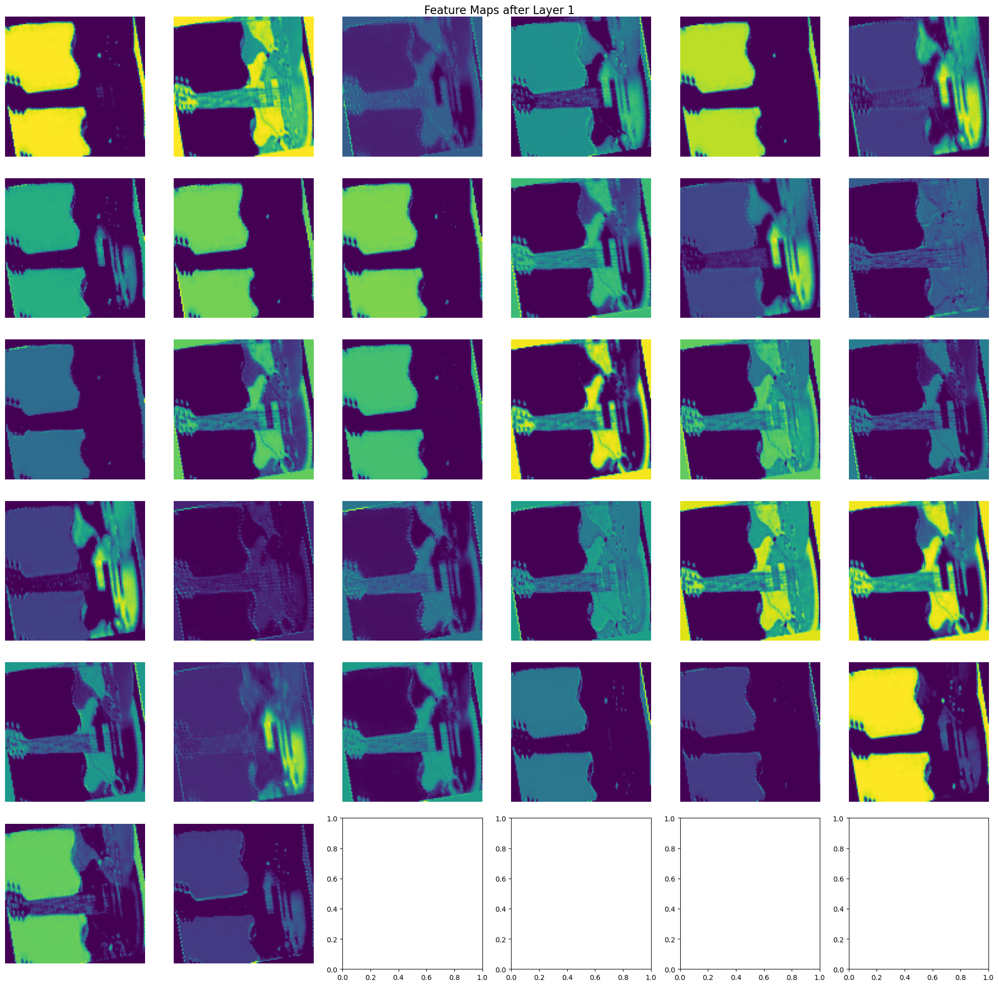

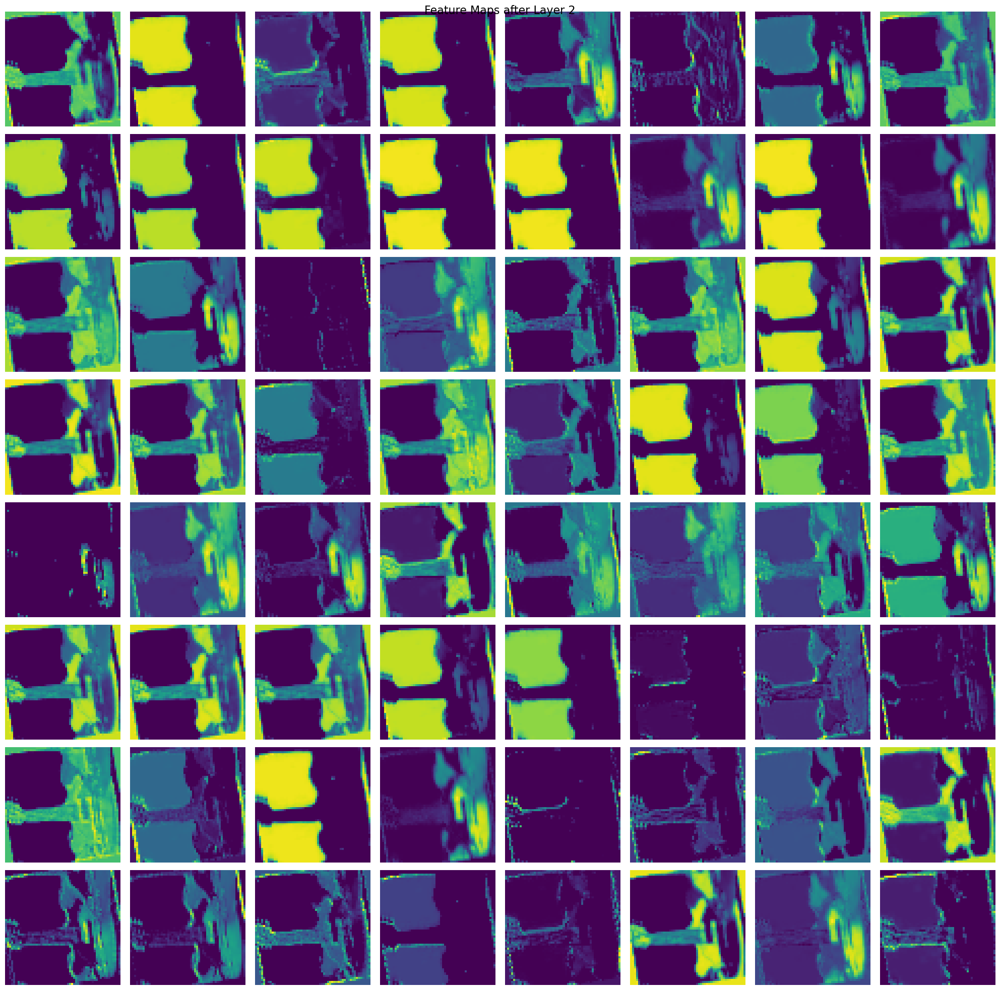

In [32]:
# For Caltech-101:
caltech_sample_image, _ = next(iter(caltech_test_loader))
caltech_sample_image = caltech_sample_image.to(device)

best_caltech_model_path = best_results_5[best_results_5['dataset'] == 'Caltech-101']['model_path'].values[0]

best_caltech_model = Caltech101Model(num_classes=101).to(device)

best_caltech_model.initialize_fc1((CALTECH_CHANNEL, CALTECH_IMG_SIZE, CALTECH_IMG_SIZE))

model_checkpoint_dict = torch.load(best_caltech_model_path, weights_only=True)
best_caltech_model.load_state_dict(model_checkpoint_dict)

visualize_all_feature_maps(best_caltech_model, caltech_sample_image)

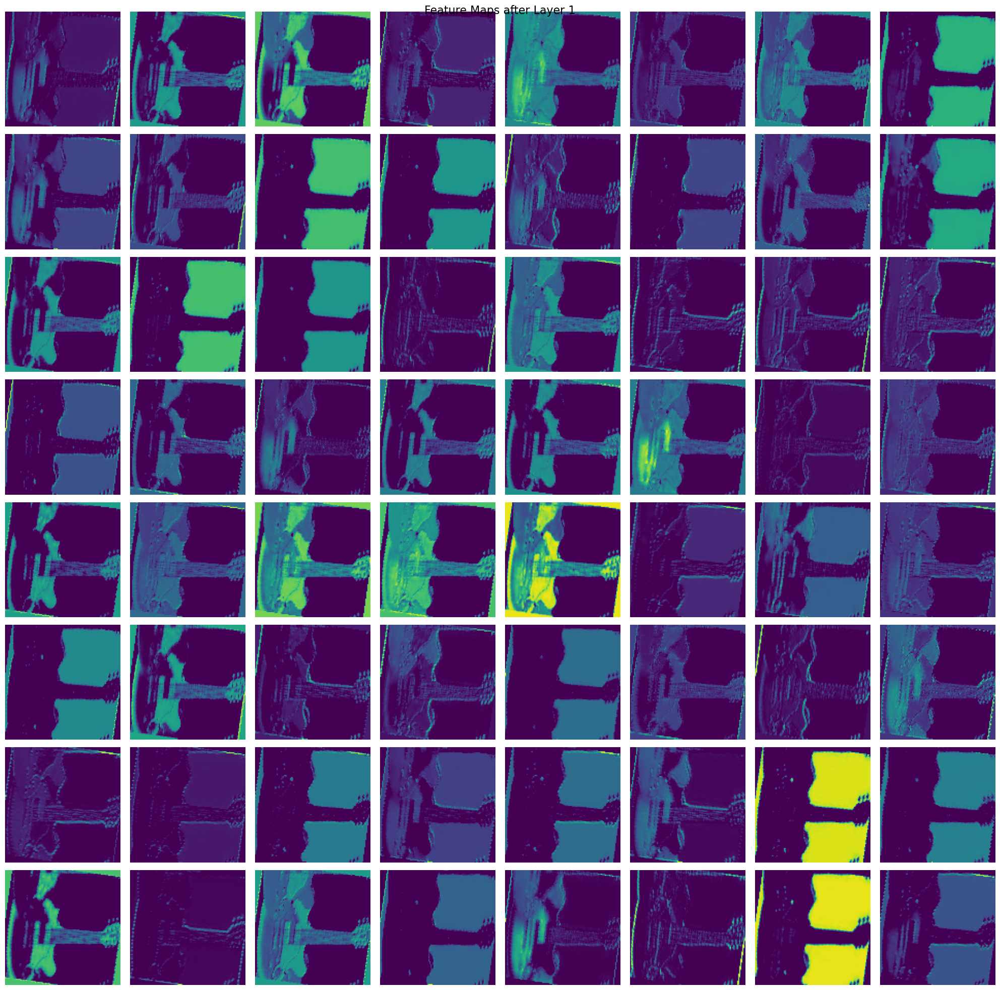

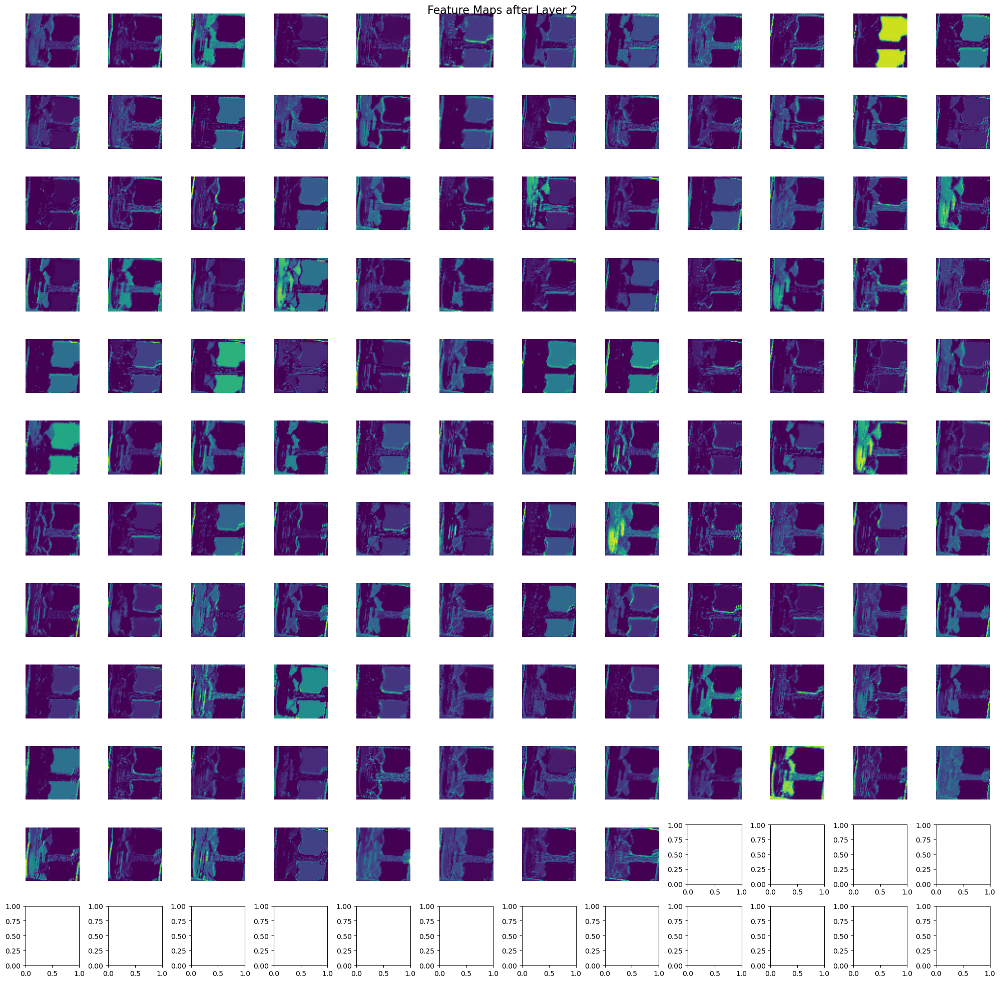

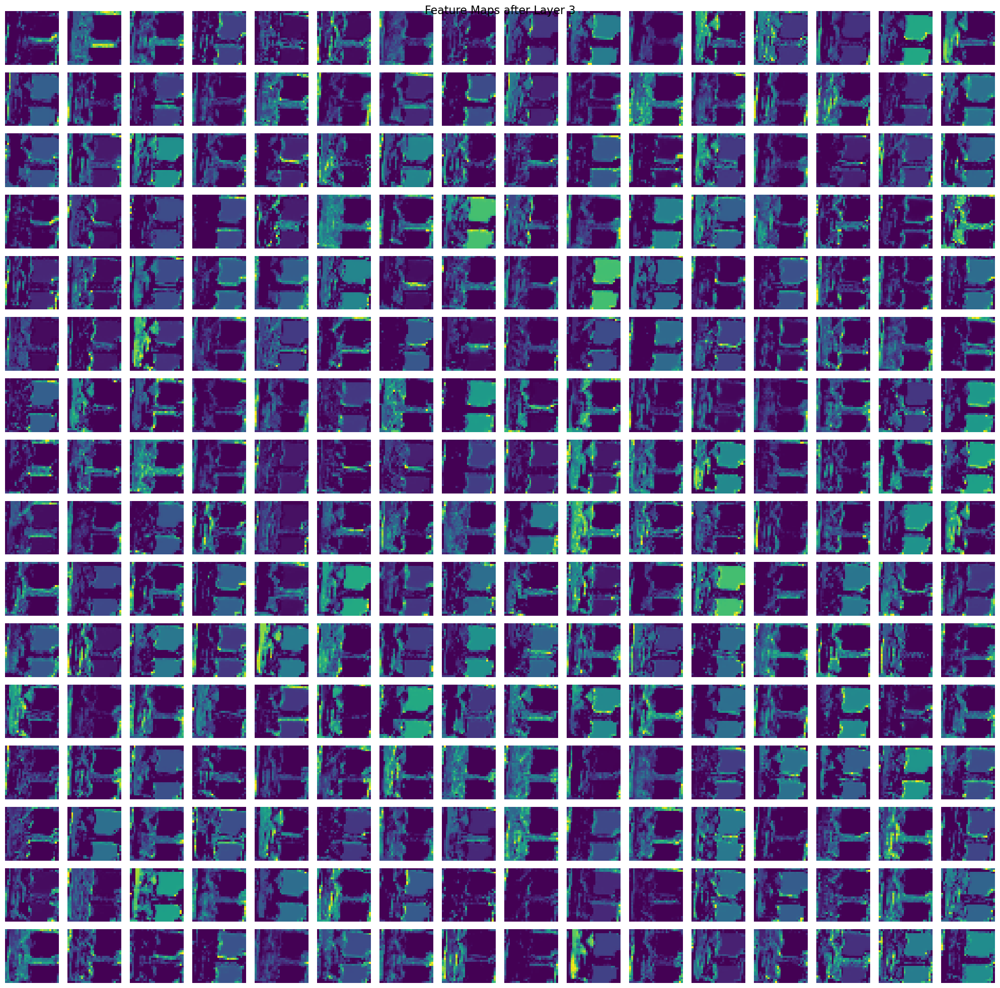

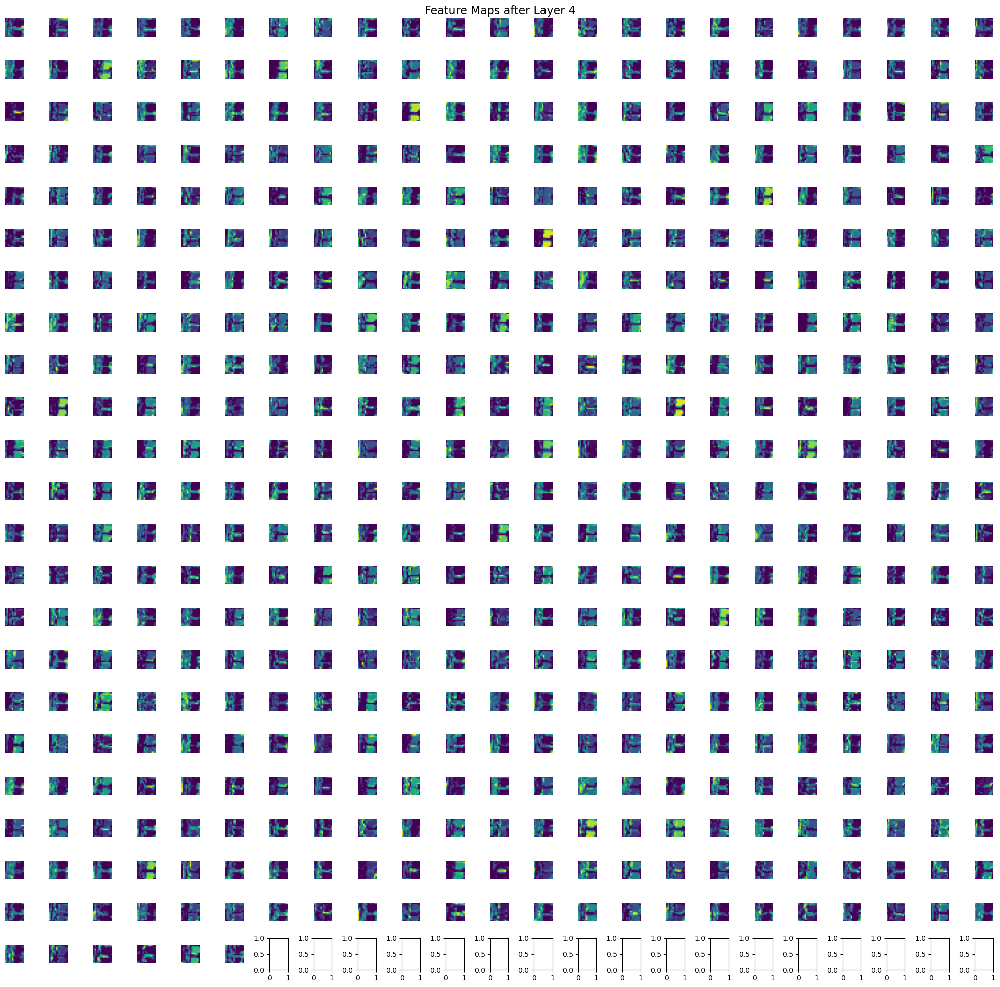

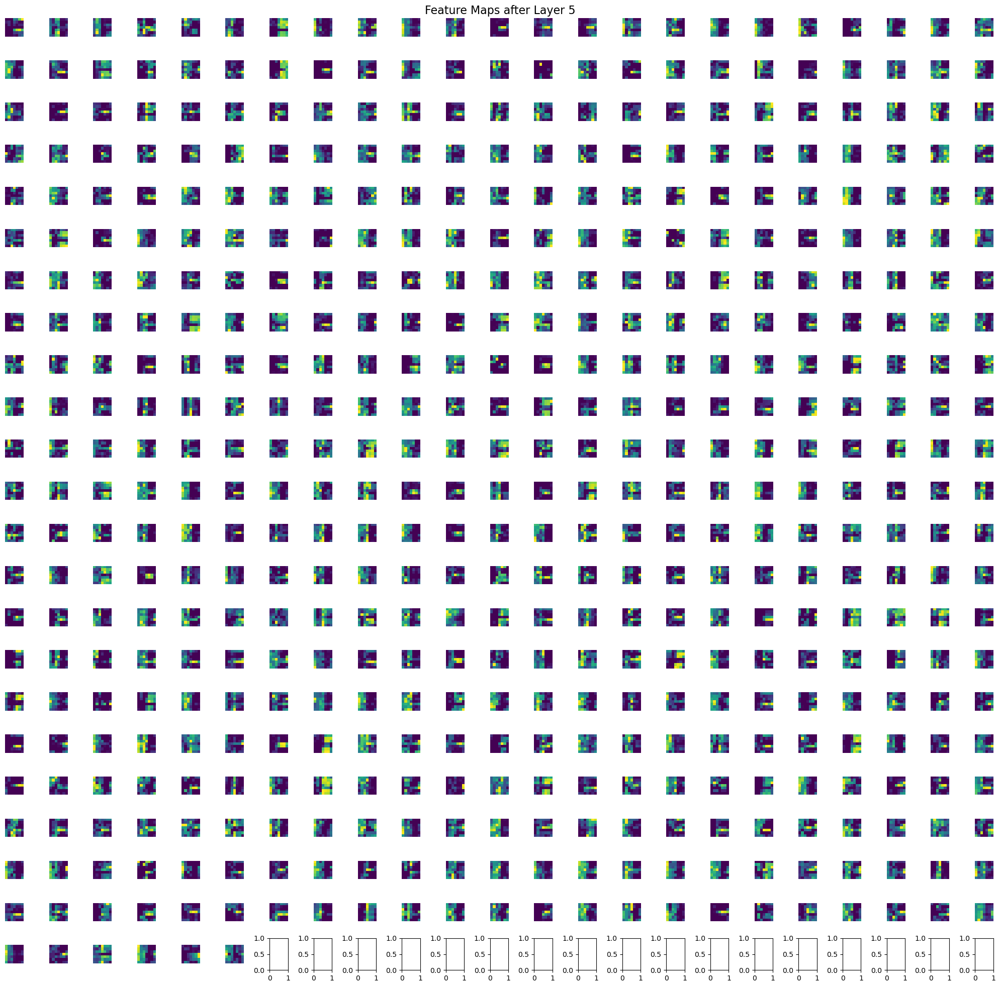

In [33]:
caltech_sample_image, _ = next(iter(caltech_test_loader))
caltech_sample_image = caltech_sample_image.to(device)

best_caltech_model_path = best_results_5[best_results_5['dataset'] == 'Caltech-101_Deep']['model_path'].values[0]

best_caltech_model = Caltech101EnhancedModel(num_classes=101).to(device)

best_caltech_model.initialize_fc1((CALTECH_CHANNEL, CALTECH_IMG_SIZE, CALTECH_IMG_SIZE))

model_checkpoint_dict = torch.load(best_caltech_model_path, weights_only=True)
best_caltech_model.load_state_dict(model_checkpoint_dict)

visualize_all_feature_maps(best_caltech_model, caltech_sample_image)